# Lagrangian Force Correction — Validation Notebook

**Experiment goal**: Predict the PM force residual `ΔF = F_ref − F_PM` using _only_  
the local deformation tensor `D[i,α,β] = ∂x^α/∂q^β` computed from 6 axis-aligned  
Lagrangian neighbours.

**What we test here**  
1. **Data sanity** — sub-volume scatter showing the Lagrangian neighbour structure  
2. **Signal check** — does the strain tensor actually correlate with `|ΔF|`?  
3. **Training monitoring** — loss curves and Pearson R evolution  
4. **Feature importance** — which strain components drive the predictions?  
5. **Inference validation** — predicted vs target `ΔF` on a held-out snapshot  
6. **Spatial validation** — are shell-crossing regions better or worse?  
7. **Verdict** — pass / fail

---
> **Config block**: edit the cell below before running anything else.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import yaml
from types import SimpleNamespace

from pathlib import Path
import shutil

CONFIG_PATH="/cosmos_storage/home/diegovillalba/JaxPM/configs/lag_force_mlp.yaml"
with open(CONFIG_PATH) as f:
        cfg = yaml.safe_load(f)

exp_cfg   = SimpleNamespace(**cfg.get("experiment",  {}))
data_cfg  = SimpleNamespace(**cfg["data"])
model_cfg = SimpleNamespace(**cfg["model"])
train_cfg = SimpleNamespace(**cfg["training"])
wb_cfg    = cfg.get("wandb", {})

# coLAPSE THIS FOR BETTER READABILITY
out_dir = Path(getattr(exp_cfg, "output_dir", "runs/lag_force/TEST")) 
out_dir.mkdir(parents=True, exist_ok=True)
shutil.copy(CONFIG_PATH, out_dir / "config.yaml")

    # ── Config extraction ─────────────────────────────────────────────────────
mesh_lr       = int(data_cfg.mesh_lr)
mesh_hr       = int(data_cfg.mesh_hr)
box_size      = float(data_cfg.box_size)
n_part        = int(data_cfg.n_particles)
data_dir      = Path(data_cfg.data_dir)
snap_train    = int(data_cfg.snap_train)
sim_train     = int(getattr(data_cfg, "sim_id_train",  0))
sim_val       = int(getattr(data_cfg, "sim_id_val",    1))
snap_val     = list(getattr(data_cfg, "snaps_val",    [snap_train]))

use_strain      = bool(getattr(model_cfg, "use_strain",      True))
use_invariants  = bool(getattr(model_cfg, "use_invariants",  False))
use_velocity    = bool(getattr(model_cfg, "use_velocity",    True))
output_mode     = getattr(model_cfg, "output_mode", "force")
hidden_dim      = int(getattr(model_cfg, "hidden_dim",     64))
n_layers        = int(getattr(model_cfg, "n_layers",       3))
output_dim      = 1 if output_mode == "potential" else 3

n_steps      = int(getattr(train_cfg, "n_steps",      500))
lr_val       = float(getattr(train_cfg, "lr",          3e-4))
weight_decay = float(getattr(train_cfg, "weight_decay", 1e-4))
warmup       = int(getattr(train_cfg, "warmup_steps",   50))
log_every    = int(getattr(train_cfg, "log_every",      25))
save_every   = int(getattr(train_cfg, "save_every",    100))
seed         = int(getattr(train_cfg, "seed",            0))

WANDB_RUN_PATH = "/cosmos_storage/home/diegovillalba/JaxPM/wandb/run-20260430_045510-60zhlrnv"


# ── Repo root (auto-detected)
_here = Path.cwd()
REPO_ROOT = _here
for _p in [_here, *_here.parents]:
    if (_p / "setup.py").exists() or (_p / "pyproject.toml").exists():
        REPO_ROOT = _p
        break

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════
#  CONFIGURATION — edit this cell
# ═══════════════════════════════════════════════════════════════════════════

from pathlib import Path

# ── Repo root (auto-detected)
_here = Path.cwd()
REPO_ROOT = _here
for _p in [_here, *_here.parents]:
    if (_p / "setup.py").exists() or (_p / "pyproject.toml").exists():
        REPO_ROOT = _p
        break

# ── Data
DATA_DIR   = REPO_ROOT.parent / "JaxPM/data/lagrangian_matched_128_256_L256.0_S50_Np128"   # directory with pos_m128_s0.npy etc.
MESH_LR    = 128
MESH_HR    = 256
BOX_SIZE   = 256.0
N_PART     = 128                          # particles per dim

SIM_TRAIN  = 0                            # sim used for training
SIM_VAL    = 1                            # sim used for validation
SNAP_TRAIN = 24                           # training snapshot
SNAP_VAL   = 24                           # validation snapshot for inference cells

# ── Model
USE_STRAIN     = True
USE_INVARIANTS = False
USE_VELOCITY   = True
HIDDEN_DIM     = 64
N_LAYERS       = 3

# ── Trained checkpoint (set after training)
# Point to a run directory that contains best_params.pkl + config.yaml
CHECKPOINT_DIR = REPO_ROOT  / "runs" / "lag_force" / "lag_force_mlp"

# ── WandB run (optional — for training curve cells)
WANDB_RUN_PATH = None   # e.g. "myentity/pm2nbody_lag_force/abcd1234"

# ── Sub-volume for 3-D scatter
SV_CENTER = [MESH_LR // 2] * 3    # [cx, cy, cz] in mesh units
SV_HALF   = 8                      # half-width in mesh units

print(f"REPO_ROOT : {REPO_ROOT}")
print(f"DATA_DIR  : {DATA_DIR}")
print(f"Checkpoint: {CHECKPOINT_DIR}")

In [3]:
# ═══════════════════════════════════════════════════════════════════════════
#  IMPORTS
# ═══════════════════════════════════════════════════════════════════════════

import sys, pickle
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import pearsonr

sys.path.insert(0, str(REPO_ROOT / "pm2nbody"))
sys.path.insert(0, str(REPO_ROOT))

import os
os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"
os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"] = "0.6"

import jax
import jax.numpy as jnp
import haiku as hk

from jaxpm.lagrangian import (
    get_axis_neighbor_indices,
    lagrangian_lattice_positions,
    compute_deformation_tensor,
    compute_deformation_features,
    make_lagrangian_corrector,
)
from train_lag_force import (
    load_snapshot,
    compute_force_pair,
    compute_metrics,
    snapshot_features,
    pearson_r as pearson_r_jax,
)

from plot_utils import (plot_density_comparison, 
                        plot_lagrangian_neighbors,
                        plot_lagrangian_features_analysis,
                        plot_deformation_features,
                        plot_deformation_features_hex,
                        plot_feature_force_correlation,
                        plot_force_distribution_analysis,
                        plot_prediction_vs_target_hex
                        )

matplotlib.rcParams.update({
    "figure.dpi": 130,
    "axes.spines.top": False,
    "axes.spines.right": False,
})
print("JAX devices:", jax.devices())

/cosmos_storage/home/diegovillalba/JaxPM/.venv/lib/python3.11/site-packages/jax_cosmo/__init__.py:2: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound
INFO:2026-04-30 08:48:07,013:jax._src.xla_bridge:834: Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
INFO  Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory


JAX devices: [CudaDevice(id=0)]


## Section 1 — Data loading & Lagrangian structure

In [4]:
# ── Load training snapshot ────────────────────────────────────────────────
print(f"Loading sim {sim_train}  snap {snap_train} ...")
pos_lr_t, vel_lr_t, pos_hr_t, a_train = load_snapshot(
    data_dir, sim_train, snap_train, mesh_lr, mesh_hr, box_size
)
print(f"  a = {a_train:.4f}   pos_lr: {pos_lr_t.shape}   vel_lr: {vel_lr_t.shape}")
if pos_hr_t is not None:
    print(f"  pos_hr: {pos_hr_t.shape}")
else:
    print("  HR positions not found — using LR particles at HR resolution")

# ── Precompute neighbour indices (once for all cells) ─────────────────────
print(f"\nPrecomputing Lagrangian neighbours  n_part={n_part}  (N={n_part**3:,}) ...")
neighbor_idx = get_axis_neighbor_indices(n_part)   # [N, 6]  int32
print(f"  neighbor_idx: {neighbor_idx.shape}")

# ── Deformation features ──────────────────────────────────────────────────
feats_train, det_D_train = snapshot_features(
    pos_lr_t, neighbor_idx, mesh_hr, use_strain, use_invariants
)
sc_frac = float(np.mean(det_D_train < 0))
strain_mag = np.sqrt(np.sum(np.asarray(feats_train[:, :9])**2, axis=-1))  # ||E||_F per particle
print(f"  feats_train: {feats_train.shape}")
print(f"  shell-crossing fraction: {sc_frac:.2%}")
print(f"  ||E||_F  mean={strain_mag.mean():.4f}  max={strain_mag.max():.4f}")

# ── Force pair ────────────────────────────────────────────────────────────
print("\nComputing force pairs (JIT compile on first call — may take ~30s) ...")
_fp_lr  = jax.jit(lambda pos: compute_force_pair(pos, mesh_lr, mesh_hr, None))
_fp_hr  = jax.jit(lambda pos, phr: compute_force_pair(pos, mesh_lr, mesh_hr, phr))
if pos_hr_t is None:
    f_pm_tr, f_ref_tr, delta_f_tr = _fp_lr(pos_lr_t)
else:
    f_pm_tr, f_ref_tr, delta_f_tr = _fp_hr(pos_lr_t, pos_hr_t)

force_mag = np.sqrt(np.sum(np.asarray(delta_f_tr)**2, axis=-1))   # |ΔF| per particle
pm_mag    = np.sqrt(np.sum(np.asarray(f_pm_tr)**2, axis=-1))
print(f"  |ΔF|  mean={force_mag.mean():.4e}  std={force_mag.std():.4e}")
print(f"  |F_PM| mean={pm_mag.mean():.4e}")
print(f"  |ΔF| / |F_PM| = {force_mag.mean()/pm_mag.mean():.3f}")

Loading sim 0  snap 40 ...
  a = 0.8347   pos_lr: (2097152, 3)   vel_lr: (2097152, 3)
  pos_hr: (2097152, 3)

Precomputing Lagrangian neighbours  n_part=128  (N=2,097,152) ...
  neighbor_idx: (2097152, 6)
  feats_train: (2097152, 9)
  shell-crossing fraction: 82.14%
  ||E||_F  mean=2.3795  max=55.6046

Computing force pairs (JIT compile on first call — may take ~30s) ...
  |ΔF|  mean=1.3634e+02  std=2.1634e+02
  |F_PM| mean=5.0347e+00
  |ΔF| / |F_PM| = 27.079


## Section 2 — Visualization: Lagrangian neighbours in sub-volume

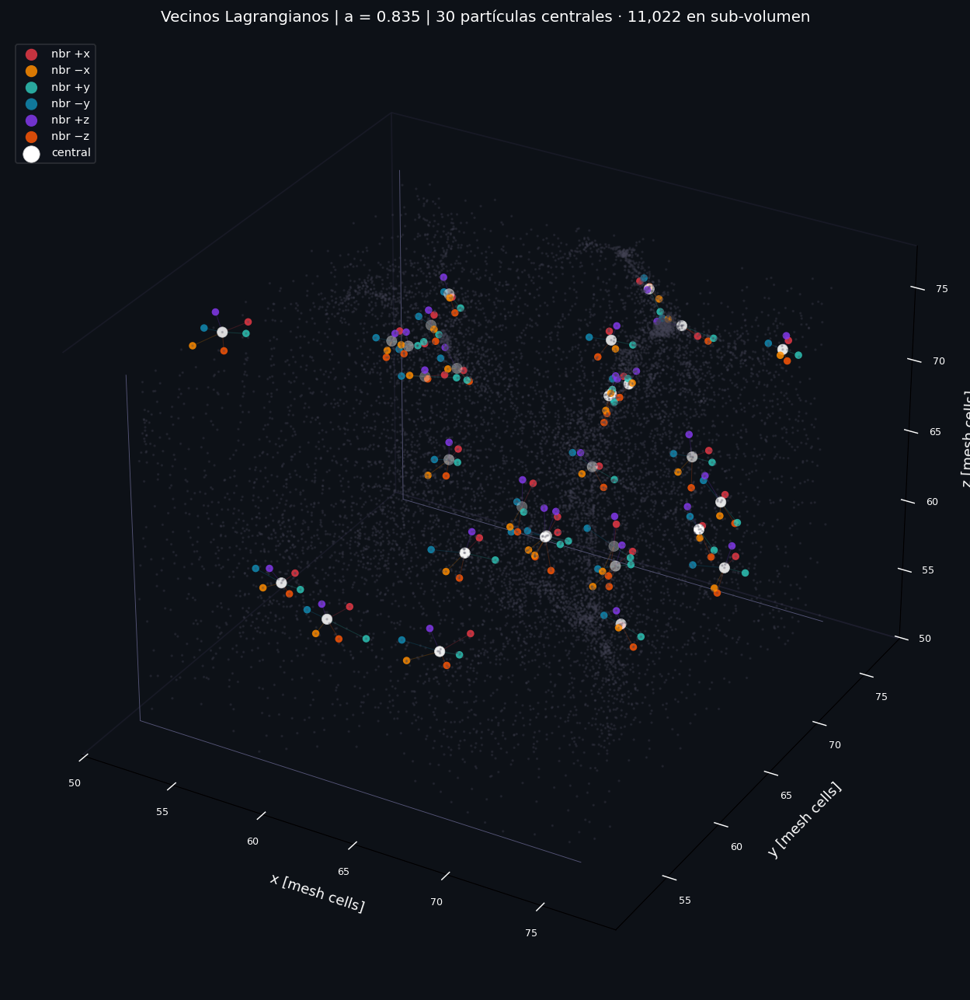

Vecinos fuera del sub-volumen euleriano: 24 / 180 (13.3%)


In [5]:
plot_lagrangian_neighbors(pos_lr_t, neighbor_idx, mesh_lr, a_train)

In [6]:
pos_np = np.asarray(jax.device_get(pos_lr_t)) % mesh_lr
cx, cy, cz = (64, 64, 64)    # SV_CENTER


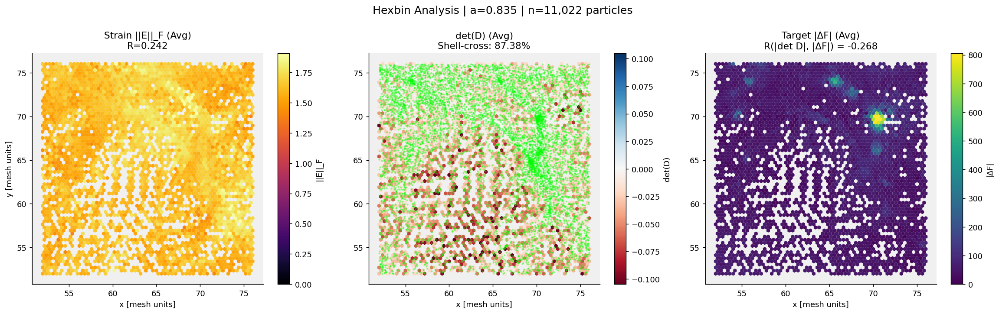

In [7]:
plot_deformation_features_hex(pos_lr_t, strain_mag, det_D_train, force_mag, mesh_lr, a_train)


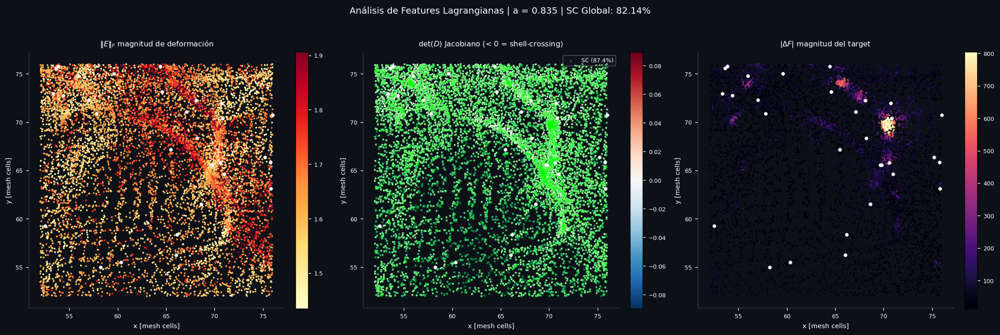


── Correlaciones en sub-volumen (Pearson) ───────────────
  R( ||E||_F , |ΔF| ) = +0.2420  p=0.00e+00
  R( |det D - 1| , |ΔF| ) = -0.2696
  → Señal Lagrangiana detectada: DÉBIL (Revisar features)

── Estadísticas del Sub-volumen ────────────────────────
  Partículas totales : 11,022
  Shell-crossing (SC): 9631 (87.38%)
  ||E||_F mean ± std : 1.6495 ± 0.1149
  |ΔF|     mean ± std : 97.0357 ± 156.1606


In [8]:
plot_lagrangian_features_analysis(pos_lr_t, feats_train, det_D_train, delta_f_tr, mesh_lr, a_train)

## Section 3 — Full dataset signal analysis

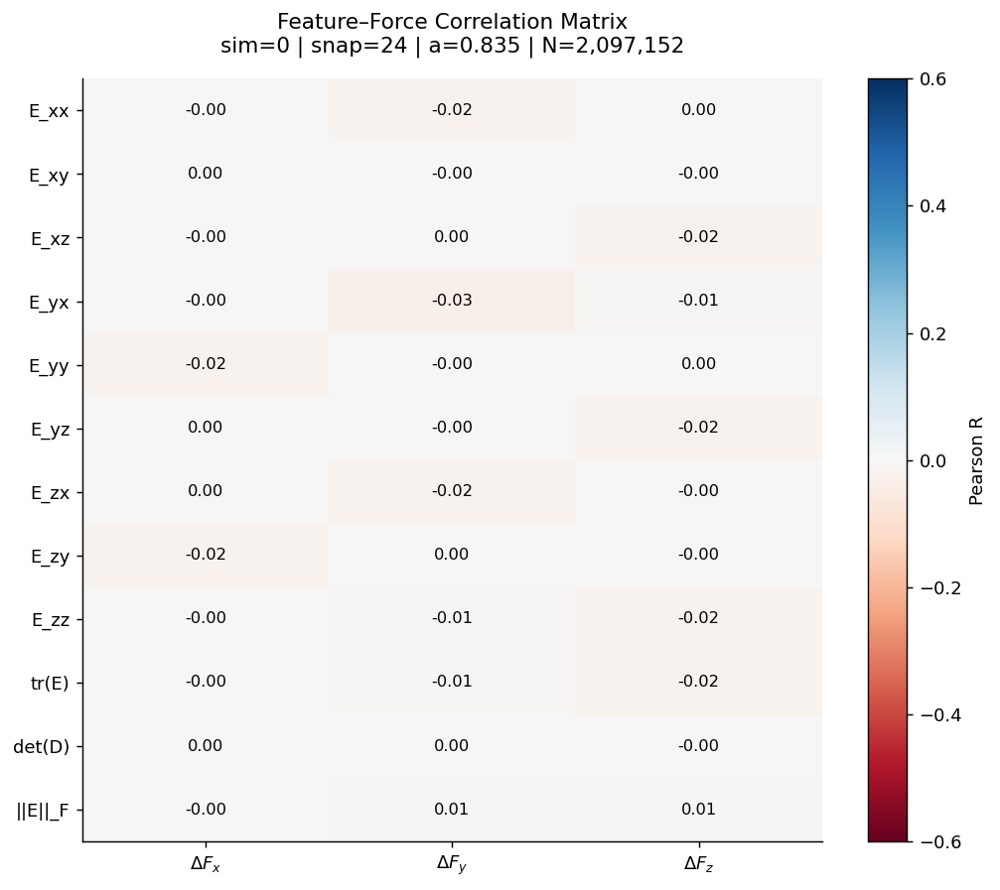

── Diagnóstico de Señal ──────────────────────────
  Max |R| detectado: 0.0284
  → RESULTADO: SIN SEÑAL (Revisar el cálculo de las features o el snapshot)
──────────────────────────────────────────────────



In [9]:
plot_feature_force_correlation(feats_train, delta_f_tr, a_train, use_invariants=True)

In [10]:
# Sub-volume mask (flat projection onto x-y plane)
SV_HALF   = 8     
sv2_mask = (
    (np.abs(pos_np[:, 0] - cx) < SV_HALF) &
    (np.abs(pos_np[:, 1] - cy) < SV_HALF) &
    (np.abs(pos_np[:, 2] - cz) < SV_HALF)
)
idx2  = np.where(sv2_mask)[0]
px    = pos_np[idx2, 0]
py    = pos_np[idx2, 1]

sm    = strain_mag[idx2]
dD    = det_D_train[idx2]
fm    = force_mag[idx2]

# Pearson R
r_sf, p_sf = pearsonr(sm, fm)
r_df, p_df = pearsonr(np.abs(dD), fm)
r_sc, p_sc = pearsonr((dD < 0).astype(float), fm)

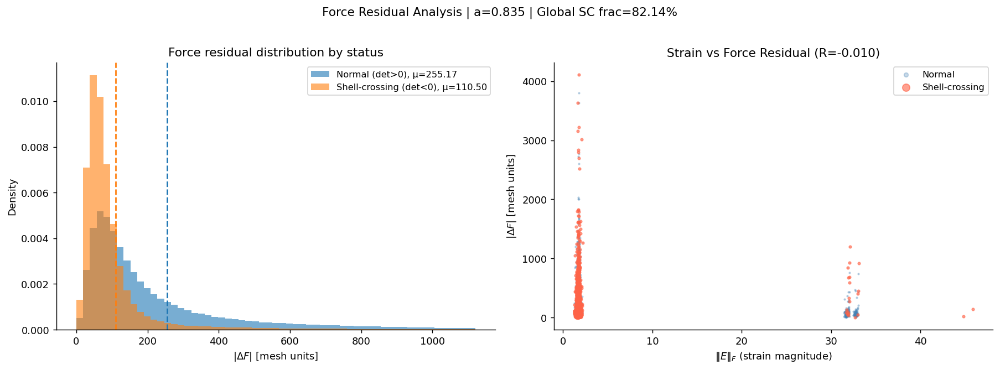

── Estadísticas por Población ──────────────────
  Media |ΔF| (Normal): 255.1669
  Media |ΔF| (SC)    : 110.4983
  → El error es -56.7% mayor en regiones de Shell-Crossing
────────────────────────────────────────────────



In [11]:
plot_force_distribution_analysis(force_mag, det_D_train, strain_mag, a_train)

## Section 4 — Training monitoring

> **Run the training first**:
> ```bash
> python pm2nbody/train_lag_force.py --config configs/lag_force_mlp.yaml
> ```
> Then set `CHECKPOINT_DIR` in the config cell above.

In [13]:
# ── Load training metrics from WandB or from local log ───────────────────
# Option A: WandB API
# Option B: fall back to any CSV exported from WandB or manually logged
CHECKPOINT_DIR = REPO_ROOT  / "runs" / "lag_force" / "lag_force_mlp"
history = None
print(WANDB_RUN_PATH)
if WANDB_RUN_PATH:
    try:
        import wandb
        api = wandb.Api()
        run = api.run(WANDB_RUN_PATH)
        history = run.history()
        print(f"Loaded WandB run: {WANDB_RUN_PATH}  ({len(history)} rows)")
    except Exception as e:
        print(f"WandB failed ({e}), falling back to CSV.")

if history is None:
    # Try local CSV (wandb exports or manual logging)
    csv_candidates = list((CHECKPOINT_DIR).glob("*.csv")) if CHECKPOINT_DIR.exists() else []
    if csv_candidates:
        import pandas as pd
        history = pd.read_csv(csv_candidates[0])
        print(f"Loaded CSV: {csv_candidates[0]}  ({len(history)} rows)")
    else:
        print("No training history found. Run training first and set WANDB_RUN_PATH or add a CSV.")
        print("Skipping training monitoring cells.")

/cosmos_storage/home/diegovillalba/JaxPM/wandb/run-20260430_045510-60zhlrnv
WandB failed (Invalid path: '/cosmos_storage/home/diegovillalba/JaxPM/wandb/run-20260430_045510-60zhlrnv' (missing project)), falling back to CSV.
No training history found. Run training first and set WANDB_RUN_PATH or add a CSV.
Skipping training monitoring cells.


In [14]:
if history is not None:
    import pandas as pd
    df = history if isinstance(history, pd.DataFrame) else pd.DataFrame(history)

    fig, axes = plt.subplots(2, 2, figsize=(14, 8))

    # ── Loss curve ────────────────────────────────────────────────────────
    ax = axes[0, 0]
    if "train/loss" in df:
        ax.semilogy(df["_step"], df["train/loss"], label="train loss", lw=1.5)
    if "val/force_mse_mean" in df:
        ax.semilogy(df["_step"], df["val/force_mse_mean"], label="val MSE mean", lw=1.5, ls="--")
    ax.set_xlabel("step")
    ax.set_ylabel("MSE (log)")
    ax.legend()
    ax.set_title("Loss curves")

    # ── Pearson R (train) ────────────────────────────────────────────────
    ax = axes[0, 1]
    for comp, ls in [("x", "-"), ("y", "--"), ("z", ":")]:
        col = f"train/pearson_r_{comp}"
        if col in df:
            ax.plot(df["_step"], df[col], label=f"R_{comp}", ls=ls, lw=1.5)
    if "train/pearson_r_mean" in df:
        ax.plot(df["_step"], df["train/pearson_r_mean"], label="R̄", color="black", lw=2)
    ax.axhline(0.5, color="green", ls=":", lw=1, label="R=0.5 target")
    ax.axhline(0.0, color="red",   ls=":", lw=0.8)
    ax.set_xlabel("step")
    ax.set_ylabel("Pearson R")
    ax.legend(fontsize=8)
    ax.set_title("Pearson R (training snapshot)")

    # ── Val MSE per snapshot ─────────────────────────────────────────────
    ax = axes[1, 0]
    for col in sorted(df.columns):
        if col.startswith("val/snap") and "force_mse" in col and "mean" not in col:
            snap_id = col.split("/")[1]
            ax.semilogy(df["_step"], df[col], label=snap_id, lw=1.3)
    ax.set_xlabel("step")
    ax.set_ylabel("MSE (log)")
    ax.legend(fontsize=8)
    ax.set_title("Validation MSE per snapshot")

    # ── Fractional MSE + shell-crossing ──────────────────────────────────
    ax = axes[1, 1]
    if "train/frac_mse" in df:
        ax.plot(df["_step"], df["train/frac_mse"], label="frac MSE", lw=1.5)
    if "train/shell_cross_frac" in df:
        ax2 = ax.twinx()
        ax2.plot(df["_step"], df["train/shell_cross_frac"], color="orange",
                 label="SC frac", lw=1.2, ls="--")
        ax2.set_ylabel("Shell-crossing fraction", color="orange")
    ax.set_xlabel("step")
    ax.set_ylabel("Fractional MSE")
    ax.set_title("Fractional MSE & shell-crossing fraction")
    ax.legend(loc="upper right", fontsize=8)

    plt.suptitle("Training monitoring", fontsize=13)
    plt.tight_layout()
    plt.show()
else:
    print("(training history not loaded — run training first)")

(training history not loaded — run training first)


## Section 5 — Load trained model & run inference

In [15]:
# ── Load checkpoint ───────────────────────────────────────────────────────
PARAMS_LOADED = None
CHECKPOINT_DIR = REPO_ROOT  / "runs" / "lag_force_weighted" / "lag_force_mlp"
if CHECKPOINT_DIR.exists():
    best_pkl = CHECKPOINT_DIR / "best_params.pkl"
    final_pkl = CHECKPOINT_DIR / "final_params.pkl"
    pkl_path  = best_pkl if best_pkl.exists() else final_pkl

    if pkl_path.exists():
        with open(pkl_path, "rb") as fh:
            params_dict = pickle.load(fh)
        # Re-freeze into an immutable Haiku dict
        PARAMS_LOADED = hk.data_structures.to_immutable_dict(params_dict)
        n_p = sum(x.size for x in jax.tree_util.tree_leaves(PARAMS_LOADED))
        print(f"Loaded checkpoint: {pkl_path.name}   ({n_p:,} parameters)")
    else:
        print(f"No checkpoint found in {CHECKPOINT_DIR}")
        print("Run training first, then update CHECKPOINT_DIR.")
else:
    print(f"Checkpoint dir does not exist: {CHECKPOINT_DIR}")
    print("Run training first.")

# ── Build model (must match training config) ──────────────────────────────
output_dim = 3   # force mode
lag_model  = make_lagrangian_corrector(
    hidden_dim=hidden_dim,
    n_layers=n_layers,
    output_dim=output_dim,
)
print(f"Model ready: hidden_dim={hidden_dim}  n_layers={n_layers}  output_dim={output_dim}")

Loaded checkpoint: best_params.pkl   (9,411 parameters)
Model ready: hidden_dim=64  n_layers=3  output_dim=3


In [16]:
SIM_TRAIN  = sim_train                            # sim used for training                         # training snapshot
SNAP_VAL   = snap_val                           # validation snapshot for inference cells
DATA_DIR   = REPO_ROOT.parent / "JaxPM/data/lagrangian_matched_128_256_L256.0_S50_Np128"
MESH_LR    = 128
MESH_HR    = 256
BOX_SIZE   = 256.0
N_PART     = 128                          # particles per dim

SIM_TRAIN  = 0                            # sim used for training
SIM_VAL    = 1                            # sim used for validation
SNAP_TRAIN = 24                           # training snapshot
SNAP_VAL   = 24  

# ── Model
USE_STRAIN     = True
USE_INVARIANTS = False
USE_VELOCITY   = True
HIDDEN_DIM     = 64
N_LAYERS       = 3

# ── Sub-volume for 3-D scatter
SV_CENTER = [MESH_LR // 2] * 3    # [cx, cy, cz] in mesh units
SV_HALF   = 8                      # half-width in mesh units

In [17]:
# ── Load validation snapshot ──────────────────────────────────────────────
print(f"Loading validation snapshot  sim={SIM_VAL}  snap={SNAP_VAL} ...")
pos_v, vel_v, pos_hr_v, a_val = load_snapshot(
    DATA_DIR, SIM_VAL, SNAP_VAL, MESH_LR, MESH_HR, BOX_SIZE
)
print(f"  a = {a_val:.4f}   N = {pos_v.shape[0]:,}")

feats_v, det_D_v = snapshot_features(
    pos_v, neighbor_idx, MESH_LR, USE_STRAIN, USE_INVARIANTS
)
strain_mag_v = np.sqrt(np.sum(np.asarray(feats_v[:, :9])**2, axis=-1))
sc_frac_v    = float(np.mean(det_D_v < 0))
print(f"  shell-crossing: {sc_frac_v:.2%}")

if pos_hr_v is None:
    _, _, delta_f_v = _fp_lr(pos_v)
else:
    _, _, delta_f_v = _fp_hr(pos_v, pos_hr_v)

force_mag_v = np.sqrt(np.sum(np.asarray(delta_f_v)**2, axis=-1))
vel_feat_v  = vel_v if USE_VELOCITY else jnp.zeros_like(vel_v)
print(f"  |ΔF| mean={force_mag_v.mean():.4e}  (target to predict)")

Loading validation snapshot  sim=1  snap=24 ...
  a = 0.5408   N = 2,097,152
  shell-crossing: 95.22%
  |ΔF| mean=6.1405e+01  (target to predict)


In [18]:
# ── Run inference ─────────────────────────────────────────────────────────
if PARAMS_LOADED is None:
    print("No checkpoint loaded — skipping inference cells.")
else:
    _apply = jax.jit(lag_model.apply)
    f_pred_v = _apply(PARAMS_LOADED, feats_v, vel_feat_v, jnp.array(a_val))  # [N, 3]
    f_pred_np = np.asarray(jax.device_get(f_pred_v))
    delta_np  = np.asarray(jax.device_get(delta_f_v))

    # Metrics
    err     = f_pred_np - delta_np
    mse_tot = float(np.mean(err**2))
    frac_mse = float(np.mean(np.sum(err**2, axis=1) / (np.sum(delta_np**2, axis=1) + 1e-12)))
    r_xyz   = [pearsonr(f_pred_np[:, c], delta_np[:, c])[0] for c in range(3)]
    r_mean  = float(np.mean(r_xyz))

    print("\n── Inference metrics (validation) ──────────────────────────")
    print(f"  MSE total   : {mse_tot:.4e}")
    print(f"  Frac MSE    : {frac_mse:.4f}")
    print(f"  Pearson R   : x={r_xyz[0]:.4f}  y={r_xyz[1]:.4f}  z={r_xyz[2]:.4f}")
    print(f"  R̄            : {r_mean:.4f}")
    print(f"  SC frac     : {sc_frac_v:.2%}")
    print("")

    verdict = (
        "✓ PASS  (R̄ > 0.5 — Lagrangian features are predictive)"
        if r_mean > 0.5 else
        "~ PARTIAL  (R̄ 0.2–0.5 — non-trivial but limited)"
        if r_mean > 0.2 else
        "✗ FAIL  (R̄ < 0.2 — deformation tensor not predictive alone)"
    )
    print(f"  Verdict: {verdict}")


── Inference metrics (validation) ──────────────────────────
  MSE total   : 1.1882e+03
  Frac MSE    : 0.4431
  Pearson R   : x=0.7446  y=0.7414  z=0.7359
  R̄            : 0.7406
  SC frac     : 95.22%

  Verdict: ✓ PASS  (R̄ > 0.5 — Lagrangian features are predictive)


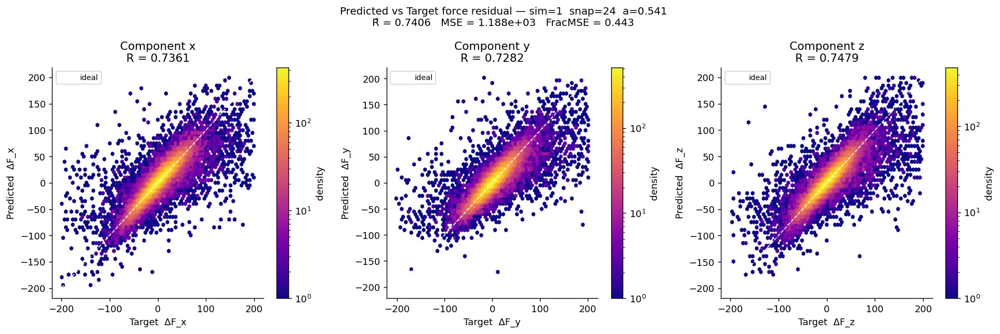

In [19]:
from matplotlib.colors import LogNorm
if PARAMS_LOADED is not None:
    COMPS   = ["x", "y", "z"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Subsample for scatter speed
    N_sc  = min(30_000, len(f_pred_np))
    ss    = np.random.default_rng(1).choice(len(f_pred_np), N_sc, replace=False)

    for ci, ax in enumerate(axes):
        tgt = delta_np[ss, ci]
        prd = f_pred_np[ss, ci]

        lim = max(abs(np.percentile(tgt, 1)), abs(np.percentile(tgt, 99)))
        lim *= 1.15

        h = ax.hexbin(tgt, prd, gridsize=70, cmap="plasma", 
                       norm=LogNorm(), mincnt=1,
                       extent=[-lim, lim, -lim, lim])
        plt.colorbar(h, ax=ax, label="density")
        ax.plot([-lim, lim], [-lim, lim], "w--", lw=1, label="ideal")

        r_c, _ = pearsonr(tgt, prd)
        ax.set_xlabel(f"Target  ΔF_{COMPS[ci]}")
        ax.set_ylabel(f"Predicted  ΔF_{COMPS[ci]}")
        ax.set_title(f"Component {COMPS[ci]}\nR = {r_c:.4f}")
        ax.legend(fontsize=8)

    plt.suptitle(
        f"Predicted vs Target force residual — sim={SIM_VAL}  snap={SNAP_VAL}  a={a_val:.3f}\n"
        f"R̄ = {r_mean:.4f}   MSE = {mse_tot:.3e}   FracMSE = {frac_mse:.3f}",
        fontsize=11,
    )
    plt.tight_layout()
    plt.show()

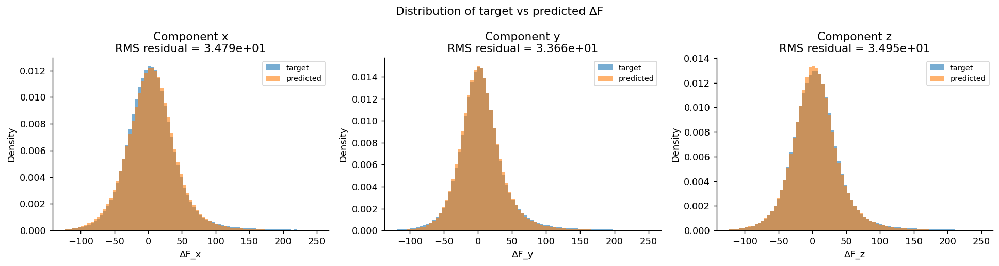

In [20]:
# ── Residual histogram ────────────────────────────────────────────────────
if PARAMS_LOADED is not None:
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))

    for ci, ax in enumerate(axes):
        tgt = delta_np[:, ci]
        prd = f_pred_np[:, ci]
        res = prd - tgt   # residual

        bins = np.linspace(*np.percentile(tgt, [0.5, 99.5]), 80)
        ax.hist(tgt, bins=bins, alpha=0.6, density=True, label="target")
        ax.hist(prd, bins=bins, alpha=0.6, density=True, label="predicted")
        ax.set_xlabel(f"ΔF_{COMPS[ci]}")
        ax.set_ylabel("Density")
        ax.legend(fontsize=8)
        ax.set_title(f"Component {COMPS[ci]}\nRMS residual = {np.sqrt(np.mean(res**2)):.3e}")

    plt.suptitle("Distribution of target vs predicted ΔF", fontsize=12)
    plt.tight_layout()
    plt.show()

## Section 6 — Spatial validation & shell-crossing analysis

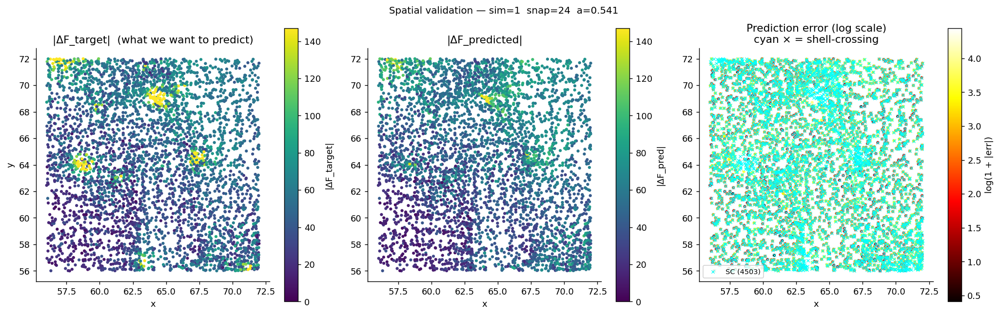

In [21]:
# ── Prediction error in the sub-volume ───────────────────────────────────
if PARAMS_LOADED is not None:
    pos_v_np    = np.asarray(jax.device_get(pos_v)) % MESH_LR
    pred_mag_v  = np.sqrt(np.sum(f_pred_np**2, axis=-1))
    err_mag_v   = np.sqrt(np.sum((f_pred_np - delta_np)**2, axis=-1))

    # Sub-volume mask for validation snapshot
    sv_v_mask = np.all(np.abs(pos_v_np - np.array(SV_CENTER)) < SV_HALF, axis=1)
    idx_v     = np.where(sv_v_mask)[0]

    fig, axes = plt.subplots(1, 3, figsize=(16, 5))

    px_v = pos_v_np[idx_v, 0]
    py_v = pos_v_np[idx_v, 1]

    # Panel 1: |ΔF_target|
    sc0 = axes[0].scatter(px_v, py_v, c=force_mag_v[idx_v], s=6, cmap="viridis",
                           vmin=0, vmax=np.percentile(force_mag_v, 95))
    plt.colorbar(sc0, ax=axes[0], label="|ΔF_target|")
    axes[0].set_title("|ΔF_target|  (what we want to predict)")
    axes[0].set_aspect("equal")
    axes[0].set_xlabel("x"); axes[0].set_ylabel("y")

    # Panel 2: |ΔF_predicted|
    sc1 = axes[1].scatter(px_v, py_v, c=pred_mag_v[idx_v], s=6, cmap="viridis",
                           vmin=0, vmax=np.percentile(force_mag_v, 95))
    plt.colorbar(sc1, ax=axes[1], label="|ΔF_pred|")
    axes[1].set_title("|ΔF_predicted|")
    axes[1].set_aspect("equal")
    axes[1].set_xlabel("x")

    # Panel 3: prediction error coloured by det(D)
    err_v_local = err_mag_v[idx_v]
    sc_v_local  = det_D_v[idx_v] < 0
    clr = np.log1p(err_v_local)   # log-scale for error magnitude
    sc2 = axes[2].scatter(px_v, py_v, c=clr, s=6, cmap="hot",
                           vmin=clr.min(), vmax=np.percentile(clr, 97))
    plt.colorbar(sc2, ax=axes[2], label="log(1 + |err|)")
    # Overlay shell-crossing particles
    axes[2].scatter(px_v[sc_v_local], py_v[sc_v_local], s=12, c="cyan",
                    marker="x", linewidths=0.7, label=f"SC ({sc_v_local.sum()})")
    axes[2].legend(fontsize=8)
    axes[2].set_title("Prediction error (log scale)\ncyan × = shell-crossing")
    axes[2].set_aspect("equal")
    axes[2].set_xlabel("x")

    plt.suptitle(
        f"Spatial validation — sim={SIM_VAL}  snap={SNAP_VAL}  a={a_val:.3f}",
        fontsize=11,
    )
    plt.tight_layout()
    plt.show()

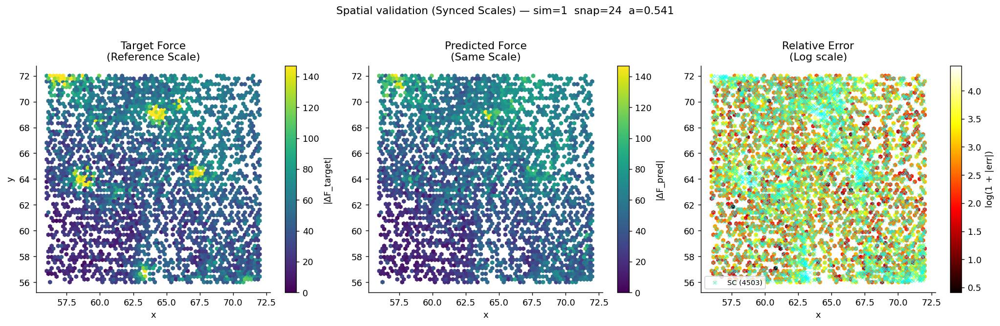

In [22]:
# ── Prediction error in the sub-volume (Hexbin con escalas alineadas) ──────────
if PARAMS_LOADED is not None:
    pos_v_np    = np.asarray(jax.device_get(pos_v)) % MESH_LR
    pred_mag_v  = np.sqrt(np.sum(f_pred_np**2, axis=-1))
    err_mag_v   = np.sqrt(np.sum((f_pred_np - delta_np)**2, axis=-1))

    sv_v_mask = np.all(np.abs(pos_v_np - np.array(SV_CENTER)) < SV_HALF, axis=1)
    idx_v     = np.where(sv_v_mask)[0]

    fig, axes = plt.subplots(1, 3, figsize=(16, 5))

    px_v = pos_v_np[idx_v, 0]
    py_v = pos_v_np[idx_v, 1]
    
    # 1. Definir escala común basada en el Target para comparación justa
    # Usamos el percentil 95 del Target para ambos paneles (0 y 1)
    vmax_common = np.percentile(force_mag_v, 95)
    gs = 65 

    # Panel 1: |ΔF_target|
    hb0 = axes[0].hexbin(px_v, py_v, C=force_mag_v[idx_v], gridsize=gs, cmap="viridis",
                          reduce_C_function=np.mean,
                          vmin=0, vmax=vmax_common)
    plt.colorbar(hb0, ax=axes[0], label="|ΔF_target|")
    axes[0].set_title("Target Force\n(Reference Scale)")
    axes[0].set_xlabel("x"); axes[0].set_ylabel("y")

    # Panel 2: |ΔF_predicted| (USA LA MISMA ESCALA QUE EL TARGET)
    hb1 = axes[1].hexbin(px_v, py_v, C=pred_mag_v[idx_v], gridsize=gs, cmap="viridis",
                          reduce_C_function=np.mean,
                          vmin=0, vmax=vmax_common)
    plt.colorbar(hb1, ax=axes[1], label="|ΔF_pred|")
    axes[1].set_title("Predicted Force\n(Same Scale)")
    axes[1].set_xlabel("x")

    # Panel 3: Prediction error (Escala independiente para el error)
    err_v_local = err_mag_v[idx_v]
    clr = np.log1p(err_v_local)
    hb2 = axes[2].hexbin(px_v, py_v, C=clr, gridsize=gs, cmap="hot",
                          reduce_C_function=np.mean,
                          vmin=clr.min(), vmax=np.percentile(clr, 97))
    plt.colorbar(hb2, ax=axes[2], label="log(1 + |err|)")
    
    sc_v_local = det_D_v[idx_v] < 0
    if sc_v_local.any():
        axes[2].scatter(px_v[sc_v_local], py_v[sc_v_local], s=15, c="cyan",
                        marker="x", linewidths=0.8, alpha=0.5, label=f"SC ({sc_v_local.sum()})")
        axes[2].legend(fontsize=8)
        
    axes[2].set_title("Relative Error\n(Log scale)")
    axes[2].set_xlabel("x")

    plt.suptitle(
        f"Spatial validation (Synced Scales) — sim={SIM_VAL}  snap={SNAP_VAL}  a={a_val:.3f}",
        fontsize=12, y=1.02
    )
    plt.tight_layout()
    plt.show()

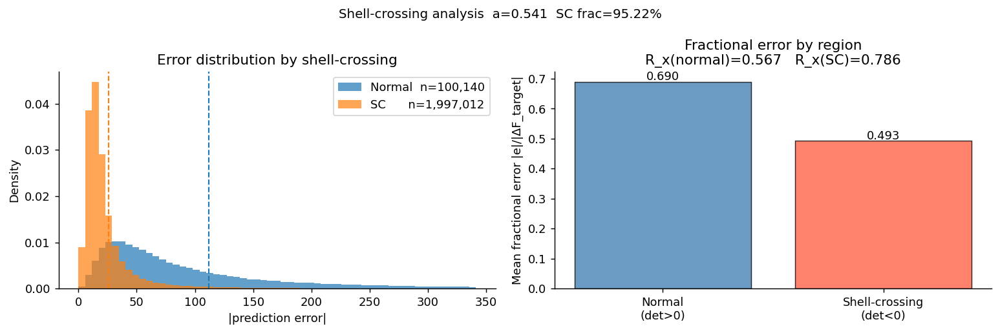


── Shell-crossing breakdown ─────────────────────────────────
  Normal particles:         mean frac_err = 0.6901   R_x = 0.5669
  Shell-crossing particles: mean frac_err = 0.4926   R_x = 0.7858
  → Model is BETTER on SC particles — strain tensor captures shell-crossing signal ✓


In [23]:
# ── Shell-crossing: does the model perform better or worse? ───────────────
if PARAMS_LOADED is not None:
    sc_mask_v  = det_D_v < 0
    nrm_mask_v = ~sc_mask_v

    err_sc  = err_mag_v[sc_mask_v]
    err_nrm = err_mag_v[nrm_mask_v]

    tgt_sc  = force_mag_v[sc_mask_v]
    tgt_nrm = force_mag_v[nrm_mask_v]

    frac_err_sc  = float(np.mean(err_sc  / (tgt_sc  + 1e-12)))
    frac_err_nrm = float(np.mean(err_nrm / (tgt_nrm + 1e-12)))

    r_sc_pred = pearsonr(f_pred_np[sc_mask_v,  0], delta_np[sc_mask_v,  0])[0]
    r_nrm_pred= pearsonr(f_pred_np[nrm_mask_v, 0], delta_np[nrm_mask_v, 0])[0]

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    bins = np.linspace(0, np.percentile(force_mag_v, 99), 60)
    axes[0].hist(err_nrm, bins=bins, density=True, alpha=0.7, label=f"Normal  n={nrm_mask_v.sum():,}")
    axes[0].hist(err_sc,  bins=bins, density=True, alpha=0.7, label=f"SC      n={sc_mask_v.sum():,}")
    axes[0].axvline(err_nrm.mean(), color="C0", ls="--", lw=1.2)
    axes[0].axvline(err_sc.mean(),  color="C1", ls="--", lw=1.2)
    axes[0].set_xlabel("|prediction error|")
    axes[0].set_ylabel("Density")
    axes[0].legend()
    axes[0].set_title("Error distribution by shell-crossing")

    labels = ["Normal\n(det>0)", "Shell-crossing\n(det<0)"]
    vals   = [frac_err_nrm, frac_err_sc]
    colors = ["steelblue", "tomato"]
    bars   = axes[1].bar(labels, vals, color=colors, alpha=0.8, edgecolor="k", linewidth=0.8)
    for bar, v in zip(bars, vals):
        axes[1].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
                     f"{v:.3f}", ha="center", fontsize=10)
    axes[1].set_ylabel("Mean fractional error |e|/|ΔF_target|")
    axes[1].set_title(
        f"Fractional error by region\n"
        f"R_x(normal)={r_nrm_pred:.3f}   R_x(SC)={r_sc_pred:.3f}"
    )

    plt.suptitle(f"Shell-crossing analysis  a={a_val:.3f}  SC frac={sc_frac_v:.2%}", fontsize=11)
    plt.tight_layout()
    plt.show()

    print("\n── Shell-crossing breakdown ─────────────────────────────────")
    print(f"  Normal particles:         mean frac_err = {frac_err_nrm:.4f}   R_x = {r_nrm_pred:.4f}")
    print(f"  Shell-crossing particles: mean frac_err = {frac_err_sc:.4f}   R_x = {r_sc_pred:.4f}")
    if frac_err_sc < frac_err_nrm:
        print("  → Model is BETTER on SC particles — strain tensor captures shell-crossing signal ✓")
    elif frac_err_sc < frac_err_nrm * 1.3:
        print("  → SC error comparable to normal — strain used but SC region is harder")
    else:
        print("  → Model is WORSE on SC particles — SC regions remain challenging")

## Section 7 — Generalisation across snapshots

In [24]:
# ── Evaluate on multiple validation snapshots ─────────────────────────────
if PARAMS_LOADED is not None:
    SNAPS_EVAL = [9, 24, 39]   # early / mid / late
    results    = []

    avals = np.load(DATA_DIR / "scale_factors.npy")

    for snap in SNAPS_EVAL:
        pv, vv, phv, av = load_snapshot(DATA_DIR, SIM_VAL, snap, MESH_LR, MESH_HR, BOX_SIZE)
        fv, dv = snapshot_features(pv, neighbor_idx, MESH_LR, USE_STRAIN, USE_INVARIANTS)
        if phv is None:
            _, _, dfv = _fp_lr(pv)
        else:
            _, _, dfv = _fp_hr(pv, phv)

        vf = vv if USE_VELOCITY else jnp.zeros_like(vv)
        prd = np.asarray(jax.device_get(
            jax.jit(lag_model.apply)(PARAMS_LOADED, fv, vf, jnp.array(av))
        ))
        tgt = np.asarray(jax.device_get(dfv))

        mse = float(np.mean((prd - tgt)**2))
        r_x = pearsonr(prd[:, 0], tgt[:, 0])[0]
        r_y = pearsonr(prd[:, 1], tgt[:, 1])[0]
        r_z = pearsonr(prd[:, 2], tgt[:, 2])[0]
        r_m = float(np.mean([r_x, r_y, r_z]))
        sc  = float(np.mean(dv < 0))
        fm  = float(np.mean(np.sqrt(np.sum(tgt**2, axis=-1))))

        results.append({
            "snap": snap, "a": av,
            "mse": mse, "R_x": r_x, "R_y": r_y, "R_z": r_z, "R_mean": r_m,
            "sc_frac": sc, "force_mag": fm,
        })
        print(f"  snap={snap:2d}  a={av:.3f}  R̄={r_m:.4f}  MSE={mse:.4e}  SC={sc:.2%}")

    import pandas as pd
    df_res = pd.DataFrame(results)
    print("\n", df_res.to_string(index=False, float_format="{:.4f}".format))

  snap= 9  a=0.265  R̄=0.8885  MSE=1.1439e+02  SC=99.99%
  snap=24  a=0.541  R̄=0.7406  MSE=1.1882e+03  SC=95.22%
  snap=39  a=0.816  R̄=0.5581  MSE=8.2449e+03  SC=84.53%

  snap      a       mse    R_x    R_y    R_z  R_mean  sc_frac  force_mag
    9 0.2653  114.3913 0.9016 0.8671 0.8966  0.8885   0.9999    24.9495
   24 0.5408 1188.1528 0.7446 0.7414 0.7359  0.7406   0.9522    61.4047
   39 0.8163 8244.9023 0.5599 0.5667 0.5478  0.5581   0.8453   111.0021


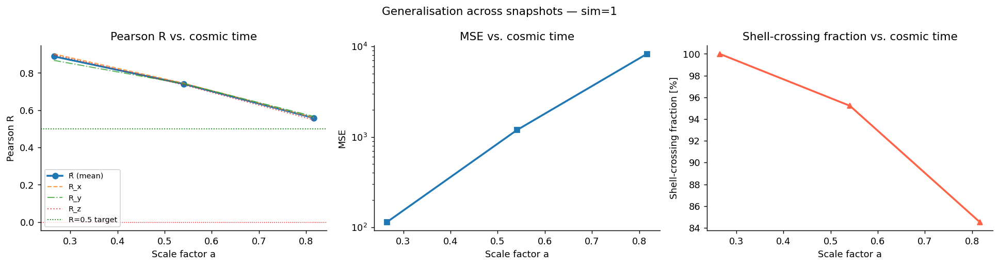

In [25]:
if PARAMS_LOADED is not None:
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))

    ax = axes[0]
    ax.plot(df_res["a"], df_res["R_mean"], "o-", lw=2, label="R̄ (mean)")
    for comp, ls in [("R_x", "--"), ("R_y", "-."), ("R_z", ":")]:
        ax.plot(df_res["a"], df_res[comp], ls, lw=1.2, label=comp, alpha=0.75)
    ax.axhline(0.5, color="green", ls=":", lw=1, label="R=0.5 target")
    ax.axhline(0.0, color="red",   ls=":", lw=0.8)
    ax.set_xlabel("Scale factor a")
    ax.set_ylabel("Pearson R")
    ax.legend(fontsize=8)
    ax.set_title("Pearson R vs. cosmic time")

    ax = axes[1]
    ax.semilogy(df_res["a"], df_res["mse"], "s-", lw=2)
    ax.set_xlabel("Scale factor a")
    ax.set_ylabel("MSE")
    ax.set_title("MSE vs. cosmic time")

    ax = axes[2]
    ax.plot(df_res["a"], df_res["sc_frac"] * 100, "^-", color="tomato", lw=2)
    ax.set_xlabel("Scale factor a")
    ax.set_ylabel("Shell-crossing fraction [%]")
    ax.set_title("Shell-crossing fraction vs. cosmic time")

    plt.suptitle(
        f"Generalisation across snapshots — sim={SIM_VAL}",
        fontsize=12,
    )
    plt.tight_layout()
    plt.show()

## Section 8 — Final verdict

In [26]:
# ── Pass / Fail summary ───────────────────────────────────────────────────
print("═" * 60)
print("  LAGRANGIAN FORCE REGRESSION — EXPERIMENT SUMMARY")
print("═" * 60)
print(f"  Training snapshot : sim={SIM_TRAIN}  snap={SNAP_TRAIN}  a={a_train:.3f}")
print(f"  Validation sim    : sim={SIM_VAL}")
print()
print("  DATA CHECKS")
print(f"    |ΔF|/|F_PM| ratio     : {force_mag.mean()/pm_mag.mean():.3f}")
print(f"      → {'non-negligible residual' if force_mag.mean()/pm_mag.mean() > 0.05 else 'small residual'}")
print(f"    SC fraction (train)   : {sc_frac:.2%}")
print(f"    R( ||E||_F, |ΔF| )   : {r_sf:.4f}")
print(f"      → {'signal present' if abs(r_sf) > 0.15 else 'weak or no linear signal'}")
print()

if PARAMS_LOADED is not None:
    print("  INFERENCE (validation snap)")
    print(f"    Pearson R̄            : {r_mean:.4f}")
    print(f"    MSE                  : {mse_tot:.4e}")
    print(f"    Frac MSE             : {frac_mse:.4f}")
    print()
    if PARAMS_LOADED is not None and 'df_res' in dir():
        best_r = df_res["R_mean"].max()
        worst_r = df_res["R_mean"].min()
        print("  GENERALISATION")
        print(f"    Best R̄ across snaps  : {best_r:.4f}")
        print(f"    Worst R̄ across snaps : {worst_r:.4f}")
        print(f"    Δ (degradation)       : {best_r - worst_r:.4f}")
        print()

    print("  VERDICT")
    if r_mean > 0.5:
        print("    ✅ PASS — Lagrangian deformation features are predictive.")
        print("       Recommended next step: combine with CNN-WST (lag_force_cnn_wst.yaml)")
    elif r_mean > 0.2:
        print("    ⚠️  PARTIAL — MLP finds structure but R̄ < 0.5.")
        print("       Try: use_invariants=true, larger hidden_dim, more training steps")
        print("       or check whether training snapshot a is large enough (a > 0.5 preferred)")
    else:
        print("    ❌ FAIL — Lagrangian features not predictive on their own.")
        print("       Check: data paths correct? force unit conversion? snapshot index?")
        print("       Diagnostic: run Section 3 to check raw R values before training.")
else:
    print("  INFERENCE: (checkpoint not loaded — run training first)")

print("═" * 60)

════════════════════════════════════════════════════════════
  LAGRANGIAN FORCE REGRESSION — EXPERIMENT SUMMARY
════════════════════════════════════════════════════════════
  Training snapshot : sim=0  snap=24  a=0.835
  Validation sim    : sim=1

  DATA CHECKS
    |ΔF|/|F_PM| ratio     : 27.079
      → non-negligible residual
    SC fraction (train)   : 82.14%
    R( ||E||_F, |ΔF| )   : 0.0728
      → weak or no linear signal

  INFERENCE (validation snap)
    Pearson R̄            : 0.7406
    MSE                  : 1.1882e+03
    Frac MSE             : 0.4431

  GENERALISATION
    Best R̄ across snaps  : 0.8885
    Worst R̄ across snaps : 0.5581
    Δ (degradation)       : 0.3303

  VERDICT
    ✅ PASS — Lagrangian deformation features are predictive.
       Recommended next step: combine with CNN-WST (lag_force_cnn_wst.yaml)
════════════════════════════════════════════════════════════


## Section 9 — CNN baseline + Lagrangian residual

Evaluate the **two-stage pipeline**:

```
F_corr = F_PM  +  ΔF_CNN  +  ΔF_Lag_residual
```

The CNN-WST predicts the bulk of the Eulerian correction.  
The residual Lagrangian MLP (trained with `lag_force_cnn_wst.yaml`) predicts what remains.

**Three models compared side-by-side**:

| Model | Target | Input |
|---|---|---|
| **Lag MLP** (Sections 5-8) | `ΔF = F_ref − F_PM` | strain + vel |
| **CNN alone** | `ΔF = F_ref − F_PM` | density field |
| **CNN + Lag residual** | `ΔF = F_ref − F_PM` | both |

> **Setup**: set `CNN_CHECKPOINT_DIR` and `LAG_RES_CHECKPOINT_DIR` below.  
> Both checkpoints must exist before running this section.

In [37]:
# ── Section 9 config ─────────────────────────────────────────────────────
# CNN-WST run directory (must contain config.yaml + best_params.pkl or best*.pkl)
CNN_CHECKPOINT_DIR = REPO_ROOT / "models" / "electric-dream-78"

# Lagrangian residual model (trained with lag_force_cnn_wst.yaml)
LAG_RES_CHECKPOINT_DIR = REPO_ROOT / "runs" / "lag_force_weighted_cnn"/"lag_force_cnn"

# Residual model architecture (must match lag_force_cnn_wst.yaml)
LAG_RES_HIDDEN_DIM = 64
LAG_RES_N_LAYERS   = 3
LAG_RES_USE_INVAR  = True    # lag_force_cnn_wst has use_invariants: true

print(f"CNN checkpoint   : {CNN_CHECKPOINT_DIR}")
print(f"Lag-res checkpoint: {LAG_RES_CHECKPOINT_DIR}")

CNN checkpoint   : /cosmos_storage/home/diegovillalba/JaxPM/models/electric-dream-78
Lag-res checkpoint: /cosmos_storage/home/diegovillalba/JaxPM/runs/lag_force_weighted_cnn/lag_force_cnn


In [29]:
# ── Load CNN-WST model ───────────────────────────────────────────────────
from train_lag_force import compute_cnn_force_correction

cnn_model_s9, cnn_params_s9 = None, None

if CNN_CHECKPOINT_DIR.exists():
    try:
        import pm2nbody.eval_utils as eu
        ri = eu.load_run(CNN_CHECKPOINT_DIR)
        cnn_model_s9  = ri["model"]
        cnn_params_s9 = ri["params"]
        print(f"CNN-WST loaded from {CNN_CHECKPOINT_DIR.name}")
        n_cnn = sum(x.size for x in jax.tree_util.tree_leaves(cnn_params_s9))
        print(f"  CNN parameters: {n_cnn:,}")
    except Exception as e:
        print(f"Could not load CNN checkpoint: {e}")
else:
    print(f"CNN checkpoint dir not found: {CNN_CHECKPOINT_DIR}")
    print("Set CNN_CHECKPOINT_DIR to a trained CNN-WST run directory.")

# Pre-compile CNN force closure (same pattern as train_lag_force.py)
if cnn_model_s9 is not None:
    _apply_cnn = jax.jit(
        lambda pos, vel, a: compute_cnn_force_correction(
            cnn_model_s9, cnn_params_s9, pos, vel, a, MESH_LR
        )
    )
    print("CNN force closure compiled.")
else:
    _apply_cnn = None

CNN-WST loaded from electric-dream-78
  CNN parameters: 16,995
CNN force closure compiled.


In [30]:
# ── CNN force correction on validation snapshot ──────────────────────────
# pos_v, vel_v, delta_f_v are already loaded from Section 5.
# Re-run Section 5 data loading cells first if variables are missing.

f_cnn_v_jax = None
if _apply_cnn is not None:
    print("Computing CNN force correction on validation snapshot …")
    f_cnn_v_jax = _apply_cnn(pos_v, vel_v, jnp.array(a_val))   # [N, 3]
    f_cnn_np    = np.asarray(jax.device_get(f_cnn_v_jax))
    delta_np_s9 = np.asarray(jax.device_get(delta_f_v))

    # CNN-only error (target is the full correction ΔF)
    err_cnn      = f_cnn_np - delta_np_s9
    mse_cnn      = float(np.mean(err_cnn**2))
    frac_mse_cnn = float(np.mean(np.sum(err_cnn**2, axis=1) /
                                 (np.sum(delta_np_s9**2, axis=1) + 1e-12)))
    r_cnn        = [pearsonr(f_cnn_np[:, c], delta_np_s9[:, c])[0] for c in range(3)]
    r_mean_cnn   = float(np.mean(r_cnn))

    # Residual after CNN: what the Lag model must predict
    delta_res_np = delta_np_s9 - f_cnn_np          # [N, 3]
    res_mag      = np.sqrt(np.sum(delta_res_np**2, axis=-1))

    raw_mag_s9   = np.sqrt(np.sum(delta_np_s9**2, axis=-1)).mean()
    cnn_mag_s9   = np.sqrt(np.sum(f_cnn_np**2,   axis=-1)).mean()

    print(f"  |ΔF_raw|   mean = {raw_mag_s9:.4e}")
    print(f"  |ΔF_CNN|   mean = {cnn_mag_s9:.4e}")
    print(f"  |ΔF_res|   mean = {res_mag.mean():.4e}   ({res_mag.mean()/raw_mag_s9:.1%} of raw)")
    print(f"  CNN R̄             = {r_mean_cnn:.4f}")
    print(f"  CNN MSE           = {mse_cnn:.4e}")
    print(f"  CNN frac MSE      = {frac_mse_cnn:.4f}")
else:
    print("CNN model not loaded — skipping CNN evaluation.")

Computing CNN force correction on validation snapshot …
  |ΔF_raw|   mean = 6.1405e+01
  |ΔF_CNN|   mean = 4.2011e-01
  |ΔF_res|   mean = 6.1155e+01   (99.6% of raw)
  CNN R̄             = 0.5338
  CNN MSE           = 2.6469e+03
  CNN frac MSE      = 0.9937


In [38]:
# ── Cell 9.4 — Load residual Lag model ────────────────────────────────────
# ── Load residual Lagrangian model ───────────────────────────────────────
PARAMS_RES = None

if LAG_RES_CHECKPOINT_DIR.exists():
    best_pkl  = LAG_RES_CHECKPOINT_DIR / "best_params.pkl"
    final_pkl = LAG_RES_CHECKPOINT_DIR / "final_params.pkl"
    pkl_path  = best_pkl if best_pkl.exists() else final_pkl

    if pkl_path.exists():
        with open(pkl_path, "rb") as fh:
            PARAMS_RES = hk.data_structures.to_immutable_dict(pickle.load(fh))
        n_res = sum(x.size for x in jax.tree_util.tree_leaves(PARAMS_RES))
        print(f"Residual Lag model loaded: {pkl_path.name}  ({n_res:,} params)")
    else:
        print(f"No checkpoint in {LAG_RES_CHECKPOINT_DIR}")
else:
    print(f"LAG_RES_CHECKPOINT_DIR not found: {LAG_RES_CHECKPOINT_DIR}")

# Build the residual model (may use invariants — set LAG_RES_USE_INVAR above)
lag_res_model = make_lagrangian_corrector(
    hidden_dim = LAG_RES_HIDDEN_DIM,
    n_layers   = LAG_RES_N_LAYERS,
    output_dim = 3,
)
print(f"Residual model: hidden_dim={LAG_RES_HIDDEN_DIM}  n_layers={LAG_RES_N_LAYERS}  use_invariants={LAG_RES_USE_INVAR}")

Residual Lag model loaded: best_params.pkl  (9,603 params)
Residual model: hidden_dim=64  n_layers=3  use_invariants=True


In [39]:
# ── Run residual inference → combine CNN + Lag ───────────────────────────
if PARAMS_RES is None or f_cnn_v_jax is None:
    print("Need both CNN and residual Lag checkpoint — skipping.")
else:
    # Residual features may use invariants
    feats_res_v, _ = snapshot_features(
        pos_v, neighbor_idx, MESH_LR, USE_STRAIN, LAG_RES_USE_INVAR
    )
    vel_feat_res_v = vel_v if USE_VELOCITY else jnp.zeros_like(vel_v)

    _apply_res = jax.jit(lag_res_model.apply)
    f_lag_res_np = np.asarray(jax.device_get(
        _apply_res(PARAMS_RES, feats_res_v, vel_feat_res_v, jnp.array(a_val))
    ))   # [N, 3]  — prediction of (ΔF − ΔF_CNN)

    # Combined: CNN + Lag residual
    f_combined_np = f_cnn_np + f_lag_res_np   # [N, 3]

    # ── Metrics: residual MLP alone ───────────────────────────────────────
    err_res      = f_lag_res_np - delta_res_np
    mse_res_only = float(np.mean(err_res**2))
    r_res        = [pearsonr(f_lag_res_np[:, c], delta_res_np[:, c])[0] for c in range(3)]
    r_mean_res   = float(np.mean(r_res))

    # ── Metrics: combined (vs full ΔF) ────────────────────────────────────
    err_comb      = f_combined_np - delta_np_s9
    mse_comb      = float(np.mean(err_comb**2))
    frac_mse_comb = float(np.mean(np.sum(err_comb**2, axis=1) /
                                   (np.sum(delta_np_s9**2, axis=1) + 1e-12)))
    r_comb        = [pearsonr(f_combined_np[:, c], delta_np_s9[:, c])[0] for c in range(3)]
    r_mean_comb   = float(np.mean(r_comb))

    print("\\n── Metrics summary ──────────────────────────────────────────")
    print(f"  {'Model':<25s}  {'R̄':>7s}  {'MSE':>12s}  {'FracMSE':>9s}")
    print("  " + "─" * 58)

    # Standalone Lag MLP (from Section 5, if available)
    if PARAMS_LOADED is not None:
        print(f"  {'Lag MLP (standalone)':<25s}  {r_mean:>7.4f}  {mse_tot:>12.4e}  {frac_mse:>9.4f}")
    print(f"  {'CNN alone':<25s}  {r_mean_cnn:>7.4f}  {mse_cnn:>12.4e}  {frac_mse_cnn:>9.4f}")
    print(f"  {'Lag residual only':<25s}  {r_mean_res:>7.4f}  {mse_res_only:>12.4e}  {'(vs residual)':>9s}")
    print(f"  {'CNN + Lag residual':<25s}  {r_mean_comb:>7.4f}  {mse_comb:>12.4e}  {frac_mse_comb:>9.4f}")
    print()
    gain_r   = r_mean_comb - r_mean_cnn
    gain_mse = (mse_cnn - mse_comb) / mse_cnn * 100
    print(f"  Δ R̄   (CNN+Lag vs CNN alone) = {gain_r:+.4f}")
    print(f"  ΔMSE% (CNN+Lag vs CNN alone) = {gain_mse:+.1f}%")
    verdict_comb = (
        "✅ Lagrangian residual IMPROVES on CNN" if gain_r > 0.02
        else "〰 Marginal improvement — residual may be noise-limited"
        if gain_r > 0
        else "❌ CNN+Lag no better than CNN alone — residual not captured"
    )
    print(f"  → {verdict_comb}")

\n── Metrics summary ──────────────────────────────────────────
  Model                           R̄           MSE    FracMSE
  ──────────────────────────────────────────────────────────
  Lag MLP (standalone)        0.7406    1.1882e+03     0.4431
  CNN alone                   0.5338    2.6469e+03     0.9937
  Lag residual only           0.7415    1.1726e+03  (vs residual)
  CNN + Lag residual          0.7444    1.1726e+03     0.4685

  Δ R̄   (CNN+Lag vs CNN alone) = +0.2106
  ΔMSE% (CNN+Lag vs CNN alone) = +55.7%
  → ✅ Lagrangian residual IMPROVES on CNN


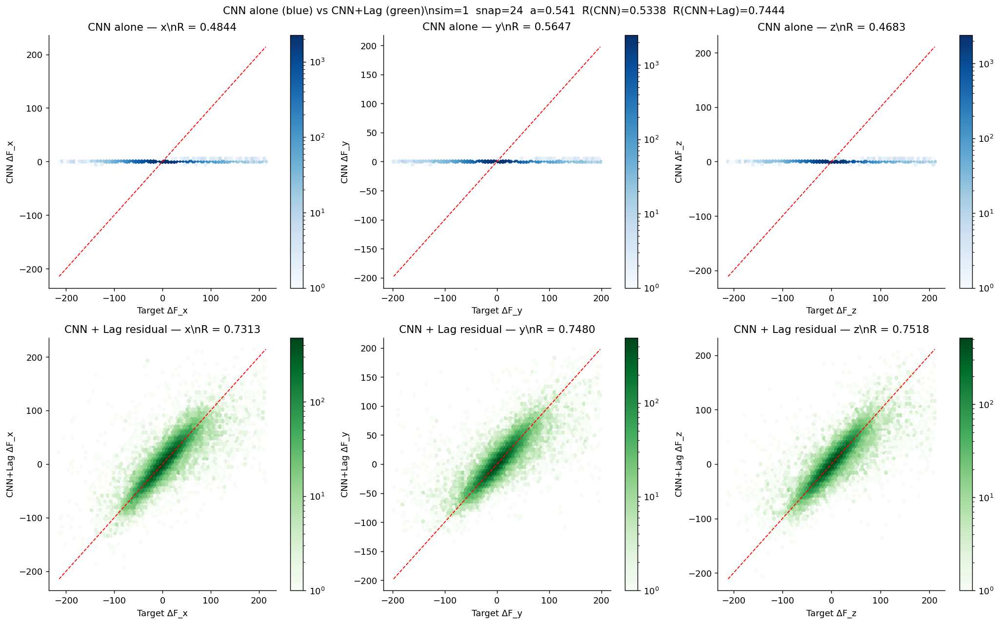

In [ ]:
# ── Predicted vs Target: CNN alone and CNN+Lag ───────────────────────────
from matplotlib.colors import LogNorm

if PARAMS_RES is not None and f_cnn_v_jax is not None:
    COMPS = ["x", "y", "z"]
    fig, axes = plt.subplots(2, 3, figsize=(16, 10))

    ss = np.random.default_rng(42).choice(len(f_combined_np), min(30_000, len(f_combined_np)), replace=False)

    for ci in range(3):
        tgt = delta_np_s9[ss, ci]
        lim = max(abs(np.percentile(tgt, 1)), abs(np.percentile(tgt, 99))) * 1.15

        # Row 0: CNN alone
        ax = axes[0, ci]
        h = ax.hexbin(tgt, f_cnn_np[ss, ci], gridsize=70, cmap="Blues",
                      norm=LogNorm(), mincnt=1, extent=[-lim, lim, -lim, lim])
        plt.colorbar(h, ax=ax)
        ax.plot([-lim, lim], [-lim, lim], "r--", lw=1)
        r_c = pearsonr(tgt, f_cnn_np[ss, ci])[0]
        ax.set_xlabel(f"Target ΔF_{COMPS[ci]}")
        ax.set_ylabel(f"CNN ΔF_{COMPS[ci]}")
        ax.set_title(f"CNN alone — {COMPS[ci]}\\nR = {r_c:.4f}")

        # Row 1: CNN + Lag residual
        ax = axes[1, ci]
        h = ax.hexbin(tgt, f_combined_np[ss, ci], gridsize=70, cmap="Greens",
                      norm=LogNorm(), mincnt=1, extent=[-lim, lim, -lim, lim])
        plt.colorbar(h, ax=ax)
        ax.plot([-lim, lim], [-lim, lim], "r--", lw=1)
        r_c2 = pearsonr(tgt, f_combined_np[ss, ci])[0]
        ax.set_xlabel(f"Target ΔF_{COMPS[ci]}")
        ax.set_ylabel(f"CNN+Lag ΔF_{COMPS[ci]}")
        ax.set_title(f"CNN + Lag residual — {COMPS[ci]}\\nR = {r_c2:.4f}")

    plt.suptitle(
        f"CNN alone (blue) vs CNN+Lag (green)\\n"
        f"sim={SIM_VAL}  snap={SNAP_VAL}  a={a_val:.3f}  "
        f"R̄(CNN)={r_mean_cnn:.4f}  R̄(CNN+Lag)={r_mean_comb:.4f}",
        fontsize=12,
    )
    plt.tight_layout()
    plt.show()

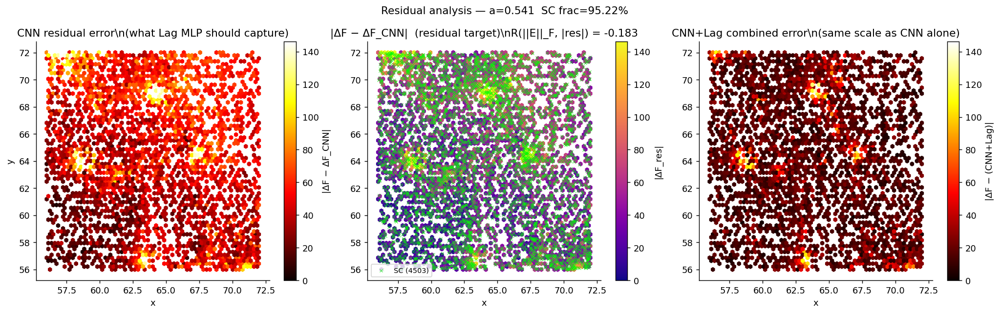

\n── Residual signal (ΔF − ΔF_CNN) ─────────────────────────────
  R(||E||_F, |ΔF_res|) full        = -0.2446
  R(||E||_F, |ΔF_res|) SC only     = -0.2249
  R(||E||_F, |ΔF_res|) normal only = -0.1259
  |ΔF_res|/|ΔF_raw| ratio          = 0.996


In [41]:
# ── What does the CNN leave behind? Residual signal analysis ─────────────
if f_cnn_v_jax is not None:
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))

    pos_v_np9 = np.asarray(jax.device_get(pos_v)) % MESH_LR
    sv_mask9  = np.all(np.abs(pos_v_np9 - np.array(SV_CENTER)) < SV_HALF, axis=1)
    idx9      = np.where(sv_mask9)[0]
    px9, py9  = pos_v_np9[idx9, 0], pos_v_np9[idx9, 1]
    gs = 65

    # CNN error magnitude
    err_cnn_mag = np.sqrt(np.sum(err_cnn**2, axis=-1))
    vmax9 = np.percentile(err_cnn_mag, 95)

    hb0 = axes[0].hexbin(px9, py9, C=err_cnn_mag[idx9], gridsize=gs, cmap="hot",
                          reduce_C_function=np.mean, vmin=0, vmax=vmax9)
    plt.colorbar(hb0, ax=axes[0], label="|ΔF − ΔF_CNN|")
    axes[0].set_title("CNN residual error\\n(what Lag MLP should capture)")
    axes[0].set_xlabel("x"); axes[0].set_ylabel("y")

    # Residual corr with strain
    res_mag9 = np.sqrt(np.sum(delta_res_np**2, axis=-1))
    r_res_strain, _ = pearsonr(strain_mag_v[idx9], res_mag9[idx9])
    hb1 = axes[1].hexbin(px9, py9, C=res_mag9[idx9], gridsize=gs, cmap="plasma",
                          reduce_C_function=np.mean, vmin=0, vmax=np.percentile(res_mag9, 95))
    plt.colorbar(hb1, ax=axes[1], label="|ΔF_res|")
    sc9 = det_D_v[idx9] < 0
    if sc9.any():
        axes[1].scatter(px9[sc9], py9[sc9], s=12, c="lime", marker="x",
                        linewidths=0.7, alpha=0.6, label=f"SC ({sc9.sum()})")
        axes[1].legend(fontsize=8)
    axes[1].set_title(f"|ΔF − ΔF_CNN|  (residual target)\\nR(||E||_F, |res|) = {r_res_strain:.3f}")
    axes[1].set_xlabel("x")

    # Combined error
    if PARAMS_RES is not None:
        err_comb_mag = np.sqrt(np.sum(err_comb**2, axis=-1))
        hb2 = axes[2].hexbin(px9, py9, C=err_comb_mag[idx9], gridsize=gs, cmap="hot",
                              reduce_C_function=np.mean, vmin=0, vmax=vmax9)
        plt.colorbar(hb2, ax=axes[2], label="|ΔF − (CNN+Lag)|")
        axes[2].set_title("CNN+Lag combined error\\n(same scale as CNN alone)")
        axes[2].set_xlabel("x")

    plt.suptitle(f"Residual analysis — a={a_val:.3f}  SC frac={sc_frac_v:.2%}", fontsize=12)
    plt.tight_layout()
    plt.show()

    # Signal check for residual
    r_res_full, _ = pearsonr(strain_mag_v, res_mag9)
    sc_mask9_full = det_D_v < 0
    r_res_sc,  _  = pearsonr(strain_mag_v[sc_mask9_full],  res_mag9[sc_mask9_full])  if sc_mask9_full.any() else (0.0, 1.0)
    r_res_nrm, _  = pearsonr(strain_mag_v[~sc_mask9_full], res_mag9[~sc_mask9_full])
    print(f"\\n── Residual signal (ΔF − ΔF_CNN) ─────────────────────────────")
    print(f"  R(||E||_F, |ΔF_res|) full        = {r_res_full:.4f}")
    print(f"  R(||E||_F, |ΔF_res|) SC only     = {r_res_sc:.4f}")
    print(f"  R(||E||_F, |ΔF_res|) normal only = {r_res_nrm:.4f}")
    print(f"  |ΔF_res|/|ΔF_raw| ratio          = {res_mag9.mean()/force_mag_v.mean():.3f}")

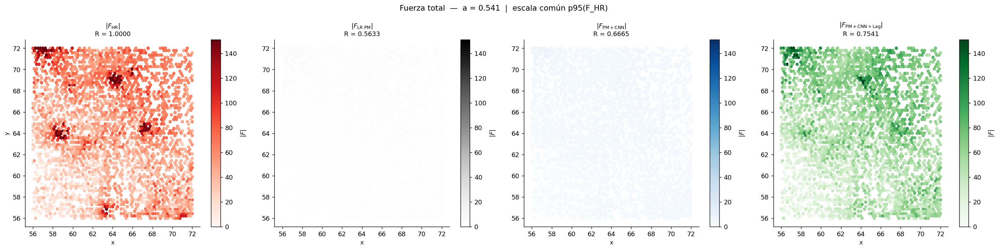

In [52]:
# ── Hexbins espaciales: F_HR, F_LR, F_CNN, F_CNN+Lag ─────────────────────
if f_cnn_v_jax is not None:

    # ── Fuerzas base ──────────────────────────────────────────────────────
    if pos_hr_v is not None:
        f_pm_v_jax, f_ref_v_jax, _ = _fp_hr(pos_v, pos_hr_v)
    else:
        f_pm_v_jax, f_ref_v_jax, _ = _fp_lr(pos_v)

    f_pm_np  = np.asarray(jax.device_get(f_pm_v_jax))
    f_ref_np = np.asarray(jax.device_get(f_ref_v_jax))

    # ── Fuerzas totales ───────────────────────────────────────────────────
    f_cnn_total  = f_pm_np + f_cnn_np
    f_comb_total = f_pm_np + f_combined_np if PARAMS_RES is not None else None

    # ── Magnitudes ────────────────────────────────────────────────────────
    panels = [
        (np.sqrt(np.sum(f_ref_np  ** 2, axis=-1)), "$|F_{\\rm HR}|$",          "Reds"),
        (np.sqrt(np.sum(f_pm_np   ** 2, axis=-1)), "$|F_{\\rm LR\\ PM}|$",     "Greys"),
        (np.sqrt(np.sum(f_cnn_total**2, axis=-1)), "$|F_{\\rm PM+CNN}|$",       "Blues"),
    ]
    if f_comb_total is not None:
        panels.append(
            (np.sqrt(np.sum(f_comb_total**2, axis=-1)),
             "$|F_{\\rm PM+CNN+Lag}|$", "Greens")
        )

    mag_ref = panels[0][0]
    vmax_f  = np.percentile(mag_ref, 95)

    # ── Sub-volumen ───────────────────────────────────────────────────────
    pos_v_np9 = np.asarray(jax.device_get(pos_v)) % MESH_LR
    sv_mask9  = np.all(np.abs(pos_v_np9 - np.array(SV_CENTER)) < SV_HALF, axis=1)
    idx9      = np.where(sv_mask9)[0]
    px9, py9  = pos_v_np9[idx9, 0], pos_v_np9[idx9, 1]

    n_cols = len(panels)
    fig, axes = plt.subplots(1, n_cols, figsize=(5.5 * n_cols, 5.5), squeeze=False)

    for col_i, (mag, title, cmap) in enumerate(panels):
        ax = axes[0, col_i]
        hb = ax.hexbin(
            px9, py9,
            C                 = mag[idx9],
            gridsize          = 65,
            cmap              = cmap,
            reduce_C_function = np.mean,
            vmin              = 0,
            vmax              = vmax_f,
        )
        plt.colorbar(hb, ax=ax, label="$|F|$")
        r = pearsonr(mag_ref[idx9], mag[idx9])[0]
        ax.set_title(f"{title}\nR = {r:.4f}", fontsize=10)
        ax.set_xlabel("x", fontsize=9)
        if col_i == 0:
            ax.set_ylabel("y", fontsize=9)

    fig.suptitle(
        f"Fuerza total  —  a = {a_val:.3f}  |  escala común p95(F_HR)",
        fontsize=12,
    )
    plt.tight_layout()
    plt.show()

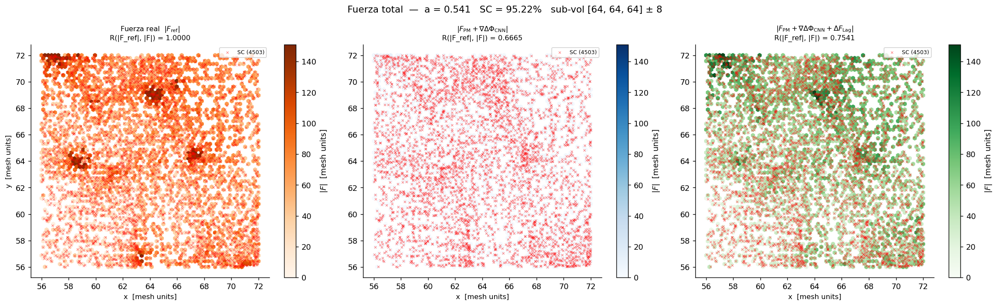

── |F| full-box ────────────────────────────────────────
  |F_ref|  mean = 6.3937e+01
  |F_cnn|  mean = 3.0764e+00   R = 0.6749
  |F_comb| mean = 5.7731e+01   R = 0.7459


In [51]:
# ── Hexbins espaciales: |F_ref| vs |F_PM+CNN| vs |F_PM+CNN+Lag| ──────────
# Reconstruye f_pm y f_ref capturando los tres retornos de _fp_lr/_fp_hr.

if f_cnn_v_jax is not None:

    # ── Reconstruir f_pm y f_ref (descartados en celda 22) ───────────────
    if pos_hr_v is not None:
        f_pm_v_jax, f_ref_v_jax, _ = _fp_hr(pos_v, pos_hr_v)
    else:
        f_pm_v_jax, f_ref_v_jax, _ = _fp_lr(pos_v)

    f_pm_np  = np.asarray(jax.device_get(f_pm_v_jax))    # [N, 3]
    f_ref_np = np.asarray(jax.device_get(f_ref_v_jax))   # [N, 3]

    # ── Fuerzas totales ────────────────────────────────────────────────────
    f_cnn_total  = f_pm_np + f_cnn_np                     # F_PM + CNN
    f_comb_total = f_pm_np + f_combined_np \
                   if PARAMS_RES is not None else None     # F_PM + CNN + Lag

    # ── Magnitudes ────────────────────────────────────────────────────────
    mag_ref  = np.sqrt(np.sum(f_ref_np   ** 2, axis=-1))
    mag_cnn  = np.sqrt(np.sum(f_cnn_total** 2, axis=-1))
    if f_comb_total is not None:
        mag_comb = np.sqrt(np.sum(f_comb_total** 2, axis=-1))

    # ── Sub-volumen (mismo patrón que celdas anteriores) ──────────────────
    pos_v_np9 = np.asarray(jax.device_get(pos_v)) % MESH_LR
    sv_mask9  = np.all(np.abs(pos_v_np9 - np.array(SV_CENTER)) < SV_HALF, axis=1)
    idx9      = np.where(sv_mask9)[0]
    px9, py9  = pos_v_np9[idx9, 0], pos_v_np9[idx9, 1]

    # Escala común = percentil 95 de la fuerza real
    vmax_f = np.percentile(mag_ref, 95)
    gs     = 65

    n_cols  = 3 if f_comb_total is not None else 2
    panels  = [
        (mag_ref,  "Fuerza real  $|F_{\\rm ref}|$",
         "Oranges"),
        (mag_cnn,  "$|F_{\\rm PM} + \\nabla\\Delta\\Phi_{\\rm CNN}|$",
         "Blues"),
    ]
    if f_comb_total is not None:
        panels.append(
            (mag_comb,
             "$|F_{\\rm PM} + \\nabla\\Delta\\Phi_{\\rm CNN} + \\Delta F_{\\rm Lag}|$",
             "Greens")
        )

    fig, axes = plt.subplots(1, n_cols, figsize=(6 * n_cols, 5.5), squeeze=False)

    for col_i, (mag, title, cmap) in enumerate(panels):
        ax = axes[0, col_i]
        hb = ax.hexbin(
            px9, py9,
            C                 = mag[idx9],
            gridsize          = gs,
            cmap              = cmap,
            reduce_C_function = np.mean,
            vmin              = 0,
            vmax              = vmax_f,
        )
        plt.colorbar(hb, ax=ax, label="$|F|$  [mesh units]")

        sc9 = det_D_v[idx9] < 0
        if sc9.any():
            ax.scatter(px9[sc9], py9[sc9], s=8, c="red", marker="x",
                       linewidths=0.6, alpha=0.5, label=f"SC ({sc9.sum()})")
            ax.legend(fontsize=7, loc="upper right")

        r_sv = pearsonr(mag_ref[idx9], mag[idx9])[0]
        ax.set_title(f"{title}\nR(|F_ref|, |F|) = {r_sv:.4f}", fontsize=9)
        ax.set_xlabel("x  [mesh units]", fontsize=9)
        if col_i == 0:
            ax.set_ylabel("y  [mesh units]", fontsize=9)

    fig.suptitle(
        f"Fuerza total  —  a = {a_val:.3f}   SC = {sc_frac_v:.2%}   "
        f"sub-vol {SV_CENTER} ± {SV_HALF}",
        fontsize=12,
    )
    plt.tight_layout()
    plt.show()

    # ── Estadísticas full-box ─────────────────────────────────────────────
    print(f"── |F| full-box {'─'*40}")
    print(f"  |F_ref|  mean = {mag_ref.mean():.4e}")
    print(f"  |F_cnn|  mean = {mag_cnn.mean():.4e}   "
          f"R = {pearsonr(mag_ref, mag_cnn)[0]:.4f}")
    if f_comb_total is not None:
        print(f"  |F_comb| mean = {mag_comb.mean():.4e}   "
              f"R = {pearsonr(mag_ref, mag_comb)[0]:.4f}")

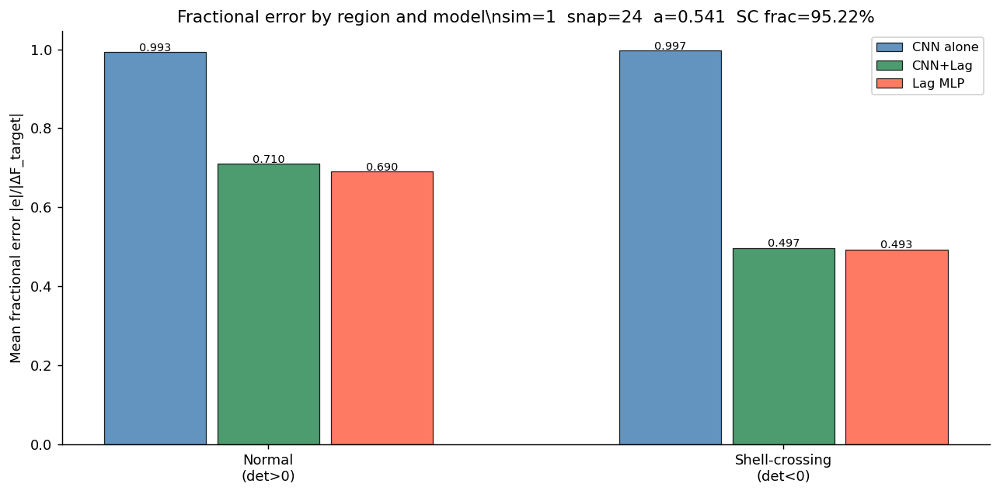

\n── SC breakdown ─────────────────────────────────────────────
  CNN alone               normal=0.9930  SC=0.9970  Δ(SC-nrm)=+0.0040
  CNN+Lag                 normal=0.7096  SC=0.4971  Δ(SC-nrm)=-0.2124
  Lag MLP                 normal=0.6901  SC=0.4926  Δ(SC-nrm)=-0.1975


In [43]:
# ── Shell-crossing comparison: CNN alone vs CNN+Lag ──────────────────────
if PARAMS_RES is not None and f_cnn_v_jax is not None:
    sc_m  = det_D_v < 0
    nrm_m = ~sc_m

    def frac_err_by_mask(err_mag, tgt_mag, mask):
        return float(np.mean(err_mag[mask] / (tgt_mag[mask] + 1e-12)))

    tgt_m = force_mag_v

    fe = {
        "cnn_sc":   frac_err_by_mask(err_cnn_mag, tgt_m, sc_m),
        "cnn_nrm":  frac_err_by_mask(err_cnn_mag, tgt_m, nrm_m),
        "comb_sc":  frac_err_by_mask(err_comb_mag, tgt_m, sc_m),
        "comb_nrm": frac_err_by_mask(err_comb_mag, tgt_m, nrm_m),
    }
    # Also include standalone Lag if available
    if PARAMS_LOADED is not None:
        err_lag_mag = np.sqrt(np.sum((f_pred_np - delta_np)**2, axis=-1))
        fe["lag_sc"]  = frac_err_by_mask(err_lag_mag, tgt_m, sc_m)
        fe["lag_nrm"] = frac_err_by_mask(err_lag_mag, tgt_m, nrm_m)

    fig, ax = plt.subplots(figsize=(10, 5))

    bar_labels = ["Normal\n(det>0)", "Shell-crossing\n(det<0)"]
    x = np.array([0.0, 1.0])
    width = 0.22

    offsets = {"CNN alone": -width, "CNN+Lag": 0.0}
    colors  = {"CNN alone": "steelblue", "CNN+Lag": "seagreen"}
    vals    = {
        "CNN alone": [fe["cnn_nrm"],  fe["cnn_sc"]],
        "CNN+Lag":   [fe["comb_nrm"], fe["comb_sc"]],
    }
    if PARAMS_LOADED is not None:
        offsets["Lag MLP"]  = width
        colors["Lag MLP"]   = "tomato"
        vals["Lag MLP"]     = [fe["lag_nrm"], fe["lag_sc"]]

    for label, offset in offsets.items():
        bars = ax.bar(x + offset, vals[label], width=width * 0.9,
                      color=colors[label], alpha=0.85, label=label,
                      edgecolor="k", linewidth=0.7)
        for bar, v in zip(bars, vals[label]):
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.003,
                    f"{v:.3f}", ha="center", fontsize=8)

    ax.set_xticks(x)
    ax.set_xticklabels(bar_labels)
    ax.set_ylabel("Mean fractional error |e|/|ΔF_target|")
    ax.legend(fontsize=9)
    ax.set_title(
        f"Fractional error by region and model\\n"
        f"sim={SIM_VAL}  snap={SNAP_VAL}  a={a_val:.3f}  SC frac={sc_frac_v:.2%}"
    )
    plt.tight_layout()
    plt.show()

    print("\\n── SC breakdown ─────────────────────────────────────────────")
    for label in offsets:
        print(f"  {label:<22s}  normal={vals[label][0]:.4f}  SC={vals[label][1]:.4f}  "
              f"Δ(SC-nrm)={vals[label][1]-vals[label][0]:+.4f}")

  snap= 9  a=0.265  R(CNN)=0.4734  R(CNN+Lag)=0.8827  SC=99.99%
  snap=24  a=0.541  R(CNN)=0.5338  R(CNN+Lag)=0.7444  SC=95.22%
  snap=39  a=0.816  R(CNN)=0.5938  R(CNN+Lag)=0.5632  SC=84.53%


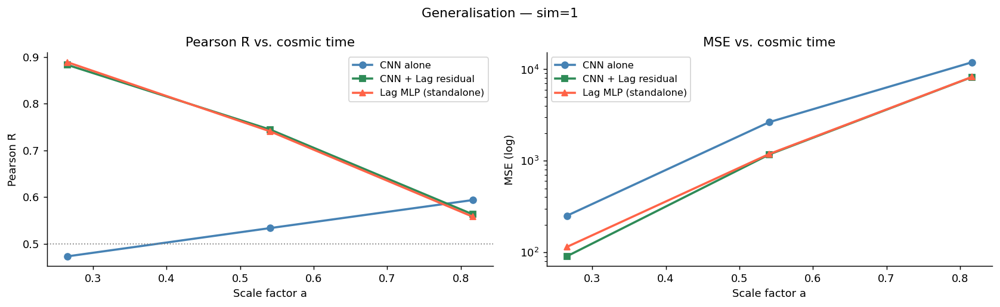

\n  snap      a  R_cnn  R_comb    mse_cnn  mse_comb  sc_frac  R_lag   mse_lag
    9 0.2653 0.4734  0.8827   250.5868   90.3681   0.9999 0.8885  114.3913
   24 0.5408 0.5338  0.7444  2646.9285 1172.5752   0.9522 0.7406 1188.1528
   39 0.8163 0.5938  0.5632 11918.7734 8214.2998   0.8453 0.5581 8244.9023


In [44]:
# ── Generalisation: all models across snapshots ──────────────────────────
if PARAMS_RES is not None and f_cnn_v_jax is not None:
    SNAPS_EVAL9 = [9, 24, 39]
    rows = []

    for snap9 in SNAPS_EVAL9:
        pv9, vv9, phv9, av9 = load_snapshot(DATA_DIR, SIM_VAL, snap9, MESH_LR, MESH_HR, BOX_SIZE)
        fv9, dv9 = snapshot_features(pv9, neighbor_idx, MESH_LR, USE_STRAIN, USE_INVARIANTS)
        fv9_res, _ = snapshot_features(pv9, neighbor_idx, MESH_LR, USE_STRAIN, LAG_RES_USE_INVAR)

        if phv9 is None:
            _, _, dfv9 = _fp_lr(pv9)
        else:
            _, _, dfv9 = _fp_hr(pv9, phv9)

        tgt9  = np.asarray(jax.device_get(dfv9))       # [N, 3]  full correction
        vf9   = vv9 if USE_VELOCITY else jnp.zeros_like(vv9)
        a9    = jnp.array(av9)

        # CNN prediction
        cnn_p9 = np.asarray(jax.device_get(_apply_cnn(pv9, vv9, a9)))

        # Residual Lag prediction
        res_p9 = np.asarray(jax.device_get(
            jax.jit(lag_res_model.apply)(PARAMS_RES, fv9_res, vf9, a9)
        ))
        comb_p9 = cnn_p9 + res_p9                       # combined

        def r_mean_fn(pred, tgt):
            return float(np.mean([pearsonr(pred[:, c], tgt[:, c])[0] for c in range(3)]))

        row = {
            "snap": snap9, "a": av9,
            "R_cnn":  r_mean_fn(cnn_p9,  tgt9),
            "R_comb": r_mean_fn(comb_p9, tgt9),
            "mse_cnn":  float(np.mean((cnn_p9  - tgt9)**2)),
            "mse_comb": float(np.mean((comb_p9 - tgt9)**2)),
            "sc_frac": float(np.mean(dv9 < 0)),
        }
        if PARAMS_LOADED is not None:
            lag_p9 = np.asarray(jax.device_get(
                jax.jit(lag_model.apply)(PARAMS_LOADED, fv9, vf9, a9)
            ))
            row["R_lag"]   = r_mean_fn(lag_p9, tgt9)
            row["mse_lag"] = float(np.mean((lag_p9 - tgt9)**2))
        rows.append(row)
        print(f"  snap={snap9:2d}  a={av9:.3f}  R(CNN)={row['R_cnn']:.4f}  "
              f"R(CNN+Lag)={row['R_comb']:.4f}  SC={row['sc_frac']:.2%}")

    import pandas as pd
    df9 = pd.DataFrame(rows)

    fig, axes = plt.subplots(1, 2, figsize=(13, 4))

    ax = axes[0]
    ax.plot(df9["a"], df9["R_cnn"],  "o-", color="steelblue", lw=2, label="CNN alone")
    ax.plot(df9["a"], df9["R_comb"], "s-", color="seagreen",  lw=2, label="CNN + Lag residual")
    if "R_lag" in df9:
        ax.plot(df9["a"], df9["R_lag"], "^-", color="tomato", lw=2, label="Lag MLP (standalone)")
    ax.axhline(0.5, color="gray", ls=":", lw=1)
    ax.set_xlabel("Scale factor a")
    ax.set_ylabel("Pearson R̄")
    ax.legend(fontsize=9)
    ax.set_title("Pearson R̄ vs. cosmic time")

    ax = axes[1]
    ax.semilogy(df9["a"], df9["mse_cnn"],  "o-", color="steelblue", lw=2, label="CNN alone")
    ax.semilogy(df9["a"], df9["mse_comb"], "s-", color="seagreen",  lw=2, label="CNN + Lag residual")
    if "mse_lag" in df9:
        ax.semilogy(df9["a"], df9["mse_lag"], "^-", color="tomato", lw=2, label="Lag MLP (standalone)")
    ax.set_xlabel("Scale factor a")
    ax.set_ylabel("MSE (log)")
    ax.legend(fontsize=9)
    ax.set_title("MSE vs. cosmic time")

    plt.suptitle(f"Generalisation — sim={SIM_VAL}", fontsize=12)
    plt.tight_layout()
    plt.show()
    print("\\n", df9.to_string(index=False, float_format="{:.4f}".format))

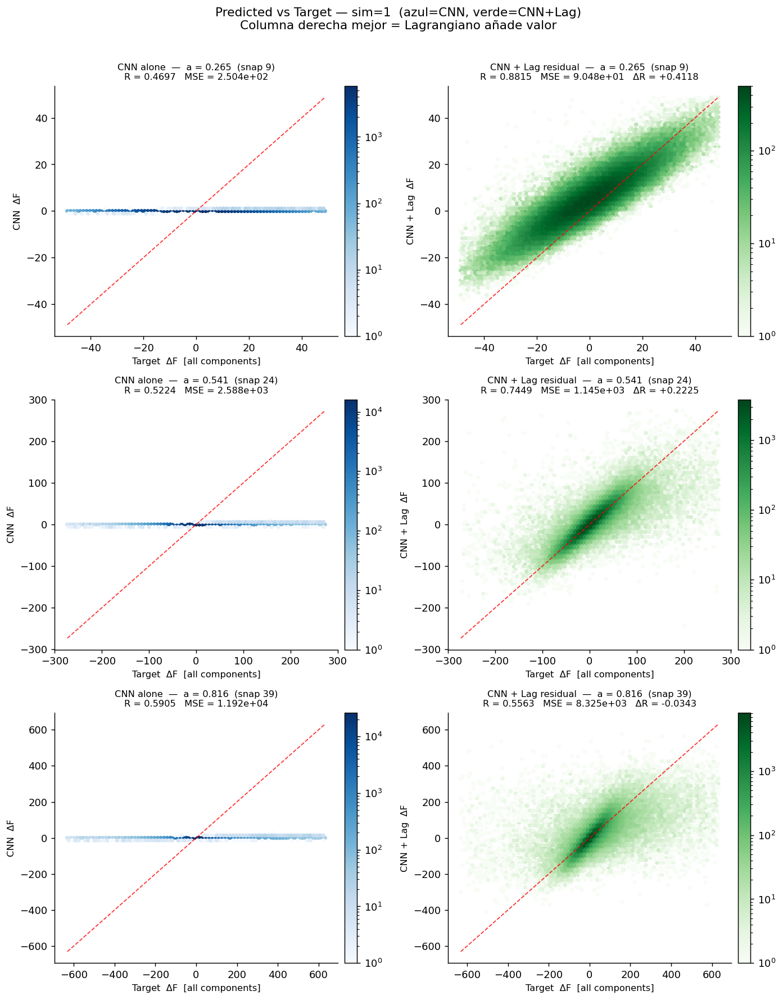

In [46]:
# ── Hexbins por snapshot: CNN alone vs CNN+Lag ────────────────────────────
# Requiere haber ejecutado la celda anterior (df9 debe existir).
# Re-carga los arrays de predicción por snapshot (la celda anterior solo
# guardó escalares en df9; aquí necesitamos los vectores completos).

from matplotlib.colors import LogNorm

SNAPS_PLOT   = [9, 24, 39]
MODEL_LABELS = ["CNN alone", "CNN + Lag residual"]
MODEL_CMAPS  = ["Blues",     "Greens"]
N_SUBSAMPLE  = 60_000          # puntos por panel (× 3 componentes = 180k hexbin pts)
RNG_PLOT     = np.random.default_rng(7)

fig, axes = plt.subplots(
    len(SNAPS_PLOT), 2,
    figsize=(11, 4.5 * len(SNAPS_PLOT)),
    squeeze=False,
)

for row_i, snap9 in enumerate(SNAPS_PLOT):

    # ── Cargar snapshot ───────────────────────────────────────────────────
    pv9, vv9, phv9, av9 = load_snapshot(DATA_DIR, SIM_VAL, snap9, MESH_LR, MESH_HR, BOX_SIZE)
    fv9_res, _ = snapshot_features(pv9, neighbor_idx, MESH_LR, USE_STRAIN, LAG_RES_USE_INVAR)
    if phv9 is None:
        _, _, dfv9 = _fp_lr(pv9)
    else:
        _, _, dfv9 = _fp_hr(pv9, phv9)

    tgt9    = np.asarray(jax.device_get(dfv9))                         # [N, 3]
    vf9     = vv9 if USE_VELOCITY else jnp.zeros_like(vv9)
    a9      = jnp.array(av9)
    cnn_p9  = np.asarray(jax.device_get(_apply_cnn(pv9, vv9, a9)))     # [N, 3]
    res_p9  = np.asarray(jax.device_get(
        jax.jit(lag_res_model.apply)(PARAMS_RES, fv9_res, vf9, a9)
    ))
    comb_p9 = cnn_p9 + res_p9                                           # [N, 3]

    # ── Subsample + flatten los 3 componentes ─────────────────────────────
    N = tgt9.shape[0]
    ss = RNG_PLOT.choice(N, size=min(N_SUBSAMPLE, N), replace=False)

    # Aplanar: [n_ss × 3] — todos los componentes como un solo conjunto de puntos
    tgt_flat  = tgt9[ss].ravel()                  # [n_ss*3]
    cnn_flat  = cnn_p9[ss].ravel()
    comb_flat = comb_p9[ss].ravel()

    lim = max(abs(np.percentile(tgt_flat, 0.5)),
              abs(np.percentile(tgt_flat, 99.5))) * 1.1

    # Pearson R sobre los tres componentes combinados
    r_cnn  = pearsonr(cnn_flat,  tgt_flat)[0]
    r_comb = pearsonr(comb_flat, tgt_flat)[0]
    dr = r_comb - r_cnn

    # ── Panel izquierdo: CNN alone ────────────────────────────────────────
    ax = axes[row_i, 0]
    h = ax.hexbin(
        tgt_flat, cnn_flat,
        gridsize=80, cmap=MODEL_CMAPS[0],
        norm=LogNorm(), mincnt=1,
        extent=[-lim, lim, -lim, lim],
    )
    plt.colorbar(h, ax=ax, pad=0.02)
    ax.plot([-lim, lim], [-lim, lim], "r--", lw=1, alpha=0.8)
    ax.set_xlabel("Target  ΔF  [all components]", fontsize=9)
    ax.set_ylabel("CNN  ΔF", fontsize=9)
    ax.set_title(
        f"CNN alone  —  a = {av9:.3f}  (snap {snap9})\n"
        f"R = {r_cnn:.4f}   MSE = {np.mean((cnn_flat-tgt_flat)**2):.3e}",
        fontsize=9,
    )

    # ── Panel derecho: CNN + Lag ──────────────────────────────────────────
    ax = axes[row_i, 1]
    h = ax.hexbin(
        tgt_flat, comb_flat,
        gridsize=80, cmap=MODEL_CMAPS[1],
        norm=LogNorm(), mincnt=1,
        extent=[-lim, lim, -lim, lim],
    )
    plt.colorbar(h, ax=ax, pad=0.02)
    ax.plot([-lim, lim], [-lim, lim], "r--", lw=1, alpha=0.8)
    ax.set_xlabel("Target  ΔF  [all components]", fontsize=9)
    ax.set_ylabel("CNN + Lag  ΔF", fontsize=9)
    ax.set_title(
        f"CNN + Lag residual  —  a = {av9:.3f}  (snap {snap9})\n"
        f"R = {r_comb:.4f}   MSE = {np.mean((comb_flat-tgt_flat)**2):.3e}"
        f"   ΔR = {dr:+.4f}",
        fontsize=9,
    )

fig.suptitle(
    f"Predicted vs Target — sim={SIM_VAL}  (azul=CNN, verde=CNN+Lag)\n"
    f"Columna derecha mejor = Lagrangiano añade valor",
    fontsize=12, y=1.01,
)
plt.tight_layout()
plt.show()

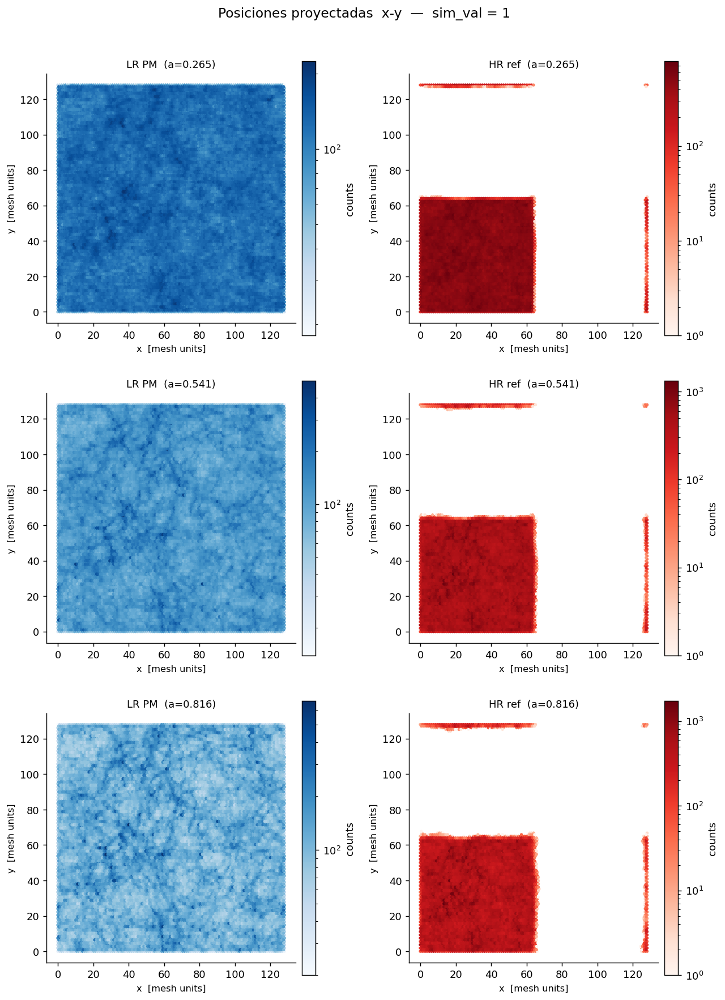

In [49]:
# ── Hexbins de posiciones: proyección 2-D (plano x-y) ────────────────────
# Compara la distribución espacial de partículas:
#   col 0 → LR (PM sin corrección)
#   col 1 → HR (referencia N-body)
# Una fila por snapshot.  Las partículas se proyectan sobre z (todas).

SNAPS_PLOT = [9, 24, 39]
PROJ       = (0, 1)          # ejes que se proyectan: (0,1)=xy, (0,2)=xz, (1,2)=yz
AXIS_LABEL = {0: "x", 1: "y", 2: "z"}

fig, axes = plt.subplots(
    len(SNAPS_PLOT), 2,
    figsize=(10, 4.5 * len(SNAPS_PLOT)),
    squeeze=False,
)

for row_i, snap in enumerate(SNAPS_PLOT):

    pv, vv, phv, av = load_snapshot(DATA_DIR, SIM_VAL, snap,
                                    MESH_LR, MESH_HR, BOX_SIZE)

    pos_lr = np.asarray(jax.device_get(pv))            # [N_lr, 3]  mesh_lr units
    pos_hr = np.asarray(jax.device_get(phv)) if phv is not None else pos_lr

    # Escala HR a unidades de mesh_lr para comparación directa
    scale_hr = MESH_LR / MESH_HR
    pos_hr_scaled = pos_hr * scale_hr                  # [N_hr, 3]

    a0, a1 = PROJ
    lim = MESH_LR                                      # 0 … mesh_lr

    for col_i, (pos, label, cmap) in enumerate([
        (pos_lr,        f"LR PM  (a={av:.3f})", "Blues"),
        (pos_hr_scaled, f"HR ref  (a={av:.3f})", "Reds"),
    ]):
        ax = axes[row_i, col_i]
        h = ax.hexbin(
            pos[:, a0] % MESH_LR,
            pos[:, a1] % MESH_LR,
            gridsize=120,
            cmap=cmap,
            norm=LogNorm(),
            mincnt=1,
            extent=[0, lim, 0, lim],
        )
        plt.colorbar(h, ax=ax, pad=0.02, label="counts")
        ax.set_xlabel(f"{AXIS_LABEL[a0]}  [mesh units]", fontsize=9)
        ax.set_ylabel(f"{AXIS_LABEL[a1]}  [mesh units]", fontsize=9)
        ax.set_title(label, fontsize=10)
        ax.set_aspect("equal")

fig.suptitle(
    f"Posiciones proyectadas  {AXIS_LABEL[a0]}-{AXIS_LABEL[a1]}"
    f"  —  sim_val = {SIM_VAL}",
    fontsize=13, y=1.01,
)
plt.tight_layout()
plt.show()

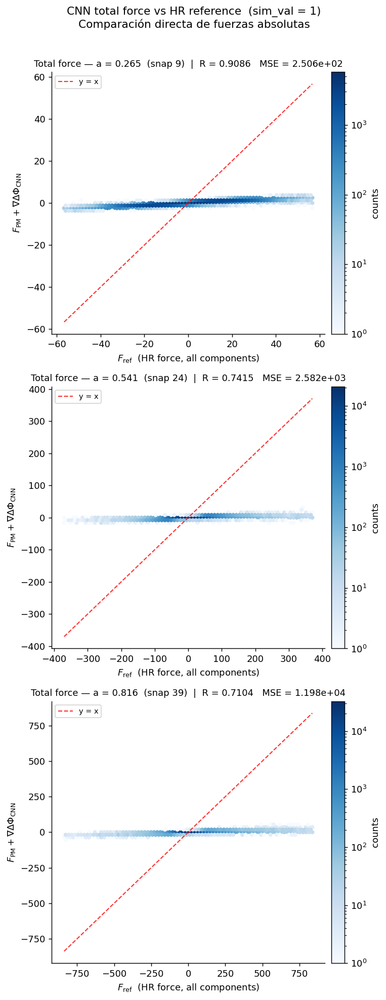

In [48]:
# ── Hexbins fuerza total: F_PM+CNN vs F_ref (HR) ──────────────────────────
# Compara fuerzas absolutas (no correcciones), igual que get_patched_transformer_force.
# Requiere: _apply_cnn, _fp_lr / _fp_hr, pv9/vv9/phv9/av9 del snapshot actual,
#           o recalcula para varios snapshots.

from scipy.stats import pearsonr
from matplotlib.colors import LogNorm

SNAPS_PLOT  = [9, 24, 39]
N_SUBSAMPLE = 60_000
RNG_PLOT    = np.random.default_rng(42)

fig, axes = plt.subplots(len(SNAPS_PLOT), 1,
                         figsize=(6, 5 * len(SNAPS_PLOT)),
                         squeeze=False)

for row_i, snap in enumerate(SNAPS_PLOT):

    # ── Cargar snapshot ───────────────────────────────────────────────────
    pv, vv, phv, av = load_snapshot(DATA_DIR, SIM_VAL, snap,
                                    MESH_LR, MESH_HR, BOX_SIZE)
    a_t = jnp.array(av)

    # F_ref  (fuerza total HR)
    if phv is not None:
        f_pm_v, f_ref_v, _ = _fp_hr(pv, phv)
    else:
        f_pm_v, f_ref_v, _ = _fp_lr(pv)

    f_pm_np  = np.asarray(jax.device_get(f_pm_v))   # [N, 3]
    f_ref_np = np.asarray(jax.device_get(f_ref_v))  # [N, 3]

    # F_CNN_total = F_PM + ∇ΔΦ_CNN
    f_cnn_corr_np = np.asarray(jax.device_get(_apply_cnn(pv, vv, a_t)))  # [N, 3]
    f_cnn_total   = f_pm_np + f_cnn_corr_np                              # [N, 3]

    # ── Subsample + aplanar los 3 componentes ─────────────────────────────
    N  = f_ref_np.shape[0]
    ss = RNG_PLOT.choice(N, size=min(N_SUBSAMPLE, N), replace=False)

    x_flat = f_ref_np[ss].ravel()       # F_ref   (target)
    y_flat = f_cnn_total[ss].ravel()    # F_PM + CNN  (predicción)

    lim = max(abs(np.percentile(x_flat, 0.2)),
              abs(np.percentile(x_flat, 99.8))) * 1.05

    r, _  = pearsonr(x_flat, y_flat)
    mse   = float(np.mean((y_flat - x_flat) ** 2))

    ax = axes[row_i, 0]
    h  = ax.hexbin(
        x_flat, y_flat,
        gridsize=80, cmap="Blues",
        norm=LogNorm(), mincnt=1,
        extent=[-lim, lim, -lim, lim],
    )
    plt.colorbar(h, ax=ax, pad=0.02, label="counts")
    ax.plot([-lim, lim], [-lim, lim], "r--", lw=1.2, alpha=0.8, label="y = x")
    ax.set_xlabel("$F_{\\rm ref}$  (HR force, all components)", fontsize=10)
    ax.set_ylabel("$F_{\\rm PM} + \\nabla\\Delta\\Phi_{\\rm CNN}$", fontsize=10)
    ax.set_title(
        f"Total force — a = {av:.3f}  (snap {snap})  |  "
        f"R = {r:.4f}   MSE = {mse:.3e}",
        fontsize=10,
    )
    ax.legend(fontsize=8, loc="upper left")

fig.suptitle(
    f"CNN total force vs HR reference  (sim_val = {SIM_VAL})\n"
    f"Comparación directa de fuerzas absolutas",
    fontsize=12, y=1.01,
)
plt.tight_layout()
plt.show()

In [45]:
# ── Full comparison verdict ───────────────────────────────────────────────
print("═" * 65)
print("  SECTION 9 — MODEL COMPARISON SUMMARY")
print("═" * 65)
print(f"  Validation: sim={SIM_VAL}  snap={SNAP_VAL}  a={a_val:.3f}  SC frac={sc_frac_v:.2%}")
print()

rows_v = []
if PARAMS_LOADED is not None:
    rows_v.append(("Lag MLP (standalone)", r_mean,     mse_tot,  frac_mse))
if f_cnn_v_jax is not None:
    rows_v.append(("CNN alone",            r_mean_cnn, mse_cnn,  frac_mse_cnn))
if PARAMS_RES is not None and f_cnn_v_jax is not None:
    rows_v.append(("CNN + Lag residual",   r_mean_comb, mse_comb, frac_mse_comb))

print(f"  {'Model':<28s}  {'R̄':>7s}  {'MSE':>12s}  {'FracMSE':>9s}")
print("  " + "─" * 62)
for name, r, mse, fmse in rows_v:
    print(f"  {name:<28s}  {r:>7.4f}  {mse:>12.4e}  {fmse:>9.4f}")
print()

if f_cnn_v_jax is not None and PARAMS_RES is not None:
    gain = r_mean_comb - r_mean_cnn
    print(f"  R̄ gain (CNN+Lag vs CNN): {gain:+.4f}")
    if gain > 0.05:
        print("  ✅ Lagrangian residual gives MEANINGFUL improvement over CNN alone.")
        print("     → The deformation tensor captures structure CNN cannot see.")
    elif gain > 0.01:
        print("  ⚠️  Small but real improvement — Lagrangian adds marginal value.")
        print("     → Try: more invariants, longer training, sc_boost tuning.")
    else:
        print("  〰  No improvement — CNN already explains the correctable residual.")
        print("     → The Lagrangian signal may be noise-limited at this resolution.")

if f_cnn_v_jax is not None and PARAMS_RES is not None and PARAMS_LOADED is not None:
    lag_better_than_cnn = r_mean > r_mean_cnn
    print()
    print(f"  Lag MLP standalone vs CNN alone: {'Lag better' if lag_better_than_cnn else 'CNN better'}")
    print(f"    → {'The Lagrangian domain adds signal CNN misses at this resolution.'  if lag_better_than_cnn else 'CNN Eulerian features are stronger — Lagrangian alone is insufficient.'}")

print("═" * 65)

═════════════════════════════════════════════════════════════════
  SECTION 9 — MODEL COMPARISON SUMMARY
═════════════════════════════════════════════════════════════════
  Validation: sim=1  snap=24  a=0.541  SC frac=95.22%

  Model                              R̄           MSE    FracMSE
  ──────────────────────────────────────────────────────────────
  Lag MLP (standalone)           0.7406    1.1882e+03     0.4431
  CNN alone                      0.5338    2.6469e+03     0.9937
  CNN + Lag residual             0.7444    1.1726e+03     0.4685

  R̄ gain (CNN+Lag vs CNN): +0.2106
  ✅ Lagrangian residual gives MEANINGFUL improvement over CNN alone.
     → The deformation tensor captures structure CNN cannot see.

  Lag MLP standalone vs CNN alone: Lag better
    → The Lagrangian domain adds signal CNN misses at this resolution.
═════════════════════════════════════════════════════════════════
